# Travel Package Purchase Prediction

## Background and Context

You are a Data Scientist for a tourism company named "Visit with us". The Policy Maker of the company wants to enable and establish a viable business model to expand the customer base.

A viable business model is a central concept that helps you to understand the existing ways of doing the business and how to change the ways for the benefit of the tourism sector.

One of the ways to expand the customer base is to introduce a new offering of packages.

Currently, there are 5 types of packages the company is offering - Basic, Standard, Deluxe, Super Deluxe, King. Looking at the data of the last year, we observed that 18% of the customers purchased the packages.

However, the marketing cost was quite high because customers were contacted at random without looking at the available information.

The company is now planning to launch a new product i.e. Wellness Tourism Package. Wellness Tourism is defined as Travel that allows the traveler to maintain, enhance or kick-start a healthy lifestyle, and support or increase one's sense of well-being.

However, this time company wants to harness the available data of existing and potential customers to make the marketing expenditure more efficient.

You as a Data Scientist at "Visit with us" travel company has to analyze the customers' data and information to provide recommendations to the Policy Maker and Marketing Team and also build a model to predict the potential customer who is going to purchase the newly introduced travel package.

### Objective

To predict which customer is more likely to purchase the newly introduced travel package.

## Data Dictionary

### Customer details:

* CustomerID: Unique customer ID
* ProdTaken: Product taken flag
* Age: Age of customer
* TypeofContact: How customer was contacted (Company Invited or Self Inquiry)
* CityTier: City tier
* Occupation: Occupation of customer
* Gender: Gender of customer
* NumberOfPersonVisited: Total number of person came with customer
* PreferredPropertyStar: Preferred hotel property rating by customer
* MaritalStatus: Marital status of customer
* NumberOfTrips: Average number of the trip in a year by customer
* Passport: The customer has passport or not
* OwnCar: Customers owns a car flag
* NumberOfChildrenVisited: Total number of children visit with customer
* Designation: Designation of the customer in the current organization
* MonthlyIncome: Gross monthly income of the customer

### Customer interaction data: 

* PitchSatisfactionScore: Sales pitch satisfactory score
* ProductPitched: Product pitched by a salesperson
* NumberOfFollowups: Total number of follow up has been done by sales person after sales pitch
* DurationOfPitch: Duration of the pitch by a salesman to customer


pip install xgboost 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve


from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
import scipy.stats as stats
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
#To install xgboost library use - !pip install xgboost 
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier

# Removes the limit from the number of displayed columns and rows.
# This is so I can see the entire dataframe when I print it
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_rows', 300)

### Read the Dataset

In [2]:
data= pd.read_excel(r'/Users/srujana/Downloads/Tourism.xlsx',sheet_name='Tourism')

In [3]:
# copying data to another varaible to avoid any changes to original data
Tour=data.copy()

### View the first and last 5 rows of the dataset.

In [4]:
Tour.head()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisited,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisited,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


In [5]:
Tour.tail()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisited,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisited,Designation,MonthlyIncome
4883,204883,1,49.0,Self Enquiry,3,9.0,Small Business,Male,3,5.0,Deluxe,4.0,Unmarried,2.0,1,1,1,1.0,Manager,26576.0
4884,204884,1,28.0,Company Invited,1,31.0,Salaried,Male,4,5.0,Basic,3.0,Single,3.0,1,3,1,2.0,Executive,21212.0
4885,204885,1,52.0,Self Enquiry,3,17.0,Salaried,Female,4,4.0,Standard,4.0,Married,7.0,0,1,1,3.0,Senior Manager,31820.0
4886,204886,1,19.0,Self Enquiry,3,16.0,Small Business,Male,3,4.0,Basic,3.0,Single,3.0,0,5,0,2.0,Executive,20289.0
4887,204887,1,36.0,Self Enquiry,1,14.0,Salaried,Male,4,4.0,Basic,4.0,Unmarried,3.0,1,3,1,2.0,Executive,24041.0


### Understand the shape of the dataset.

In [6]:
Tour.shape

(4888, 20)

In [7]:
print(f'Dataset has {Tour.shape[0]} rows and {Tour.shape[1]} columns.')  # f-string

Dataset has 4888 rows and 20 columns.


### Check the data types of the columns for the dataset.

In [8]:
Tour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CustomerID               4888 non-null   int64  
 1   ProdTaken                4888 non-null   int64  
 2   Age                      4662 non-null   float64
 3   TypeofContact            4863 non-null   object 
 4   CityTier                 4888 non-null   int64  
 5   DurationOfPitch          4637 non-null   float64
 6   Occupation               4888 non-null   object 
 7   Gender                   4888 non-null   object 
 8   NumberOfPersonVisited    4888 non-null   int64  
 9   NumberOfFollowups        4843 non-null   float64
 10  ProductPitched           4888 non-null   object 
 11  PreferredPropertyStar    4862 non-null   float64
 12  MaritalStatus            4888 non-null   object 
 13  NumberOfTrips            4748 non-null   float64
 14  Passport                

Observations:
- CustomerID,ProdTaken,CityTier,NumberOfPersonVisited,Passport,PitchSatisfactionScore,OwnCar variables are of type int64.
- Age,DurationOfPitch,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,NumberOfChildrenVisited,MonthlyIncome are of type float64.
- TypeofContact,Occupation,Gender,ProductPitched,MaritalStatus,Designation are of type Object.

## Count the datatypes

In [9]:
#count the number of variables in each datatype
Tour.dtypes.value_counts()

int64      7
float64    7
object     6
dtype: int64

## Verify the duplicate records

In [10]:
sum(Tour.duplicated())

0

In [11]:
from pandas_profiling import ProfileReport

profile = ProfileReport(Tour)
# to view report created by pandas profile
profile

## Fixing the data types

In [12]:
for feature in Tour.columns: # Loop through all the columns in the dataframe
    if Tour[feature].dtype == 'object': # Only apply for columns with object datatype
        Tour[feature] = pd.Categorical(Tour[feature])# Convert the columns to categorical
Tour.head()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisited,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisited,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


In [13]:
Tour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   CustomerID               4888 non-null   int64   
 1   ProdTaken                4888 non-null   int64   
 2   Age                      4662 non-null   float64 
 3   TypeofContact            4863 non-null   category
 4   CityTier                 4888 non-null   int64   
 5   DurationOfPitch          4637 non-null   float64 
 6   Occupation               4888 non-null   category
 7   Gender                   4888 non-null   category
 8   NumberOfPersonVisited    4888 non-null   int64   
 9   NumberOfFollowups        4843 non-null   float64 
 10  ProductPitched           4888 non-null   category
 11  PreferredPropertyStar    4862 non-null   float64 
 12  MaritalStatus            4888 non-null   category
 13  NumberOfTrips            4748 non-null   float64 
 14  Passport

`we can see that the memory usage has decreased from 763.9KB to 564.4KB`

### Observations -

- ProdTaken is the dependent variable.
- All the independent variables are of type int64,float64 or categorical.

### Summary of the dataset

In [14]:
 Tour.describe(include="all")   

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisited,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisited,Designation,MonthlyIncome
count,4888.000000,4888.000000,4662.000000,4863,4888.000000,4637.000000,4888,4888,4888.000000,4843.000000,4888,4862.000000,4888,4748.000000,4888.000000,4888.000000,4888.000000,4822.000000,4888,4655.000000
unique,NaN,NaN,NaN,2,NaN,NaN,4,3,NaN,NaN,5,NaN,4,NaN,NaN,NaN,NaN,NaN,5,NaN
top,NaN,NaN,NaN,Self Enquiry,NaN,NaN,Salaried,Male,NaN,NaN,Basic,NaN,Married,NaN,NaN,NaN,NaN,NaN,Executive,NaN
freq,NaN,NaN,NaN,3444,NaN,NaN,2368,2916,NaN,NaN,1842,NaN,2340,NaN,NaN,NaN,NaN,NaN,1842,NaN
mean,202443.500000,0.188216,37.622265,NaN,1.654255,15.490835,NaN,NaN,2.905074,3.708445,NaN,3.581037,NaN,3.236521,0.290917,3.078151,0.620295,1.187267,NaN,23619.853491
std,1411.188388,0.390925,9.316387,NaN,0.916583,8.519643,NaN,NaN,0.724891,1.002509,NaN,0.798009,NaN,1.849019,0.454232,1.365792,0.485363,0.857861,NaN,5380.698361
min,200000.000000,0.000000,18.000000,NaN,1.000000,5.000000,NaN,NaN,1.000000,1.000000,NaN,3.000000,NaN,1.000000,0.000000,1.000000,0.000000,0.000000,NaN,1000.000000
25%,201221.750000,0.000000,31.000000,NaN,1.000000,9.000000,NaN,NaN,2.000000,3.000000,NaN,3.000000,NaN,2.000000,0.000000,2.000000,0.000000,1.000000,NaN,20346.000000
50%,202443.500000,0.000000,36.000000,NaN,1.000000,13.000000,NaN,NaN,3.000000,4.000000,NaN,3.000000,NaN,3.000000,0.000000,3.000000,1.000000,1.000000,NaN,22347.000000
75%,203665.250000,0.000000,44.000000,NaN,3.000000,20.000000,NaN,NaN,3.000000,4.000000,NaN,4.000000,NaN,4.000000,1.000000,4.000000,1.000000,2.000000,NaN,25571.000000


Observations:
-    We notice some missing values in Age,DurationofPitch,TypeofContact,MonthlyIncome,NumberOfChildrenVisited,NumberOfTrips,PreferredPropertyStar and NumberOfFollowups variables.
- The average age of a person is 37.6yrs ,while the minimum age is 18yrs and the maximum age is 61yrs.The median value is 36yrs. Age variable appears to be normally distributed with slight skewness to the right.
- TypeofContact variable has 2 unique types with Self Enquiry being widely preferred contact by the customers.
- The average value of DurationOfPitch variable is 15.49, while the min is 5, the max value at 127 and 75% value at 20. This indicates that there are some outliers to the right.
- Occupation variable has 4 unique types with Salaried customers being the most. 
- Gender has 3 unique types with more male customers.
- ProductPitched has 5 unique types and there are more records with basic product.
- MaritalStatus has 4 unique classes and there are more married customers compared to others.
- Designation variable has 4 unique classes and there are more executive customers compared to others.
- MonthlyIncome variable has some missing values with the mean 23619.853491 and the median 22347.0. The minimum value is 1000, with third quantile at 25571 and max value at 98678 indicating that the variable is highly right skewed.

In [15]:
# checking for unique values in ID column
Tour["CustomerID"].nunique()

4888

* Since all the values in ID column are unique we can drop it

In [16]:
Tour.drop(["CustomerID"],axis=1,inplace=True)

In [17]:
Tour.columns

Index(['ProdTaken', 'Age', 'TypeofContact', 'CityTier', 'DurationOfPitch',
       'Occupation', 'Gender', 'NumberOfPersonVisited', 'NumberOfFollowups',
       'ProductPitched', 'PreferredPropertyStar', 'MaritalStatus',
       'NumberOfTrips', 'Passport', 'PitchSatisfactionScore', 'OwnCar',
       'NumberOfChildrenVisited', 'Designation', 'MonthlyIncome'],
      dtype='object')

In [18]:
Tour["Age"].unique()

array([41., 49., 37., 33., nan, 32., 59., 30., 38., 36., 35., 31., 34.,
       28., 29., 22., 53., 21., 42., 44., 46., 39., 24., 43., 50., 27.,
       26., 48., 55., 45., 56., 23., 51., 40., 54., 58., 20., 25., 19.,
       57., 52., 47., 18., 60., 61.])

In [19]:
Tour["TypeofContact"].unique()

['Self Enquiry', 'Company Invited', NaN]
Categories (2, object): ['Self Enquiry', 'Company Invited']

There are some null values in TypeofContact variable

In [20]:
Tour["CityTier"].value_counts()

1    3190
3    1500
2     198
Name: CityTier, dtype: int64

In [21]:
Tour["DurationOfPitch"].unique()

array([  6.,  14.,   8.,   9.,  30.,  29.,  33.,  22.,  21.,  32.,  25.,
        27.,  11.,  17.,  15.,  13.,  12.,  16.,  10.,  31.,  18.,  nan,
        24.,  35.,  28.,  20.,  26.,  34.,  23.,   5.,  19., 126.,   7.,
        36., 127.])

There are Null Values in DurationOfPitch variable

In [22]:
Tour["Occupation"].value_counts()

Salaried          2368
Small Business    2084
Large Business     434
Free Lancer          2
Name: Occupation, dtype: int64

In [23]:
Tour["Gender"].value_counts()

Male       2916
Female     1817
Fe Male     155
Name: Gender, dtype: int64

The thrid category is incorrectly printed with space and thereby considered as another category. It needs to be fixed.

In [24]:
# Correcting the Gender- Fe Male category to Female
Tour.Gender.replace('Fe Male','Female',inplace=True)

In [25]:
Tour["Gender"].value_counts()

Male      2916
Female    1972
Name: Gender, dtype: int64

In [26]:
Tour["NumberOfPersonVisited"].value_counts()

3    2402
2    1418
4    1026
1      39
5       3
Name: NumberOfPersonVisited, dtype: int64

In [27]:
Tour["NumberOfFollowups"].value_counts()

4.0    2068
3.0    1466
5.0     768
2.0     229
1.0     176
6.0     136
Name: NumberOfFollowups, dtype: int64

In [28]:
Tour["ProductPitched"].value_counts()

Basic           1842
Deluxe          1732
Standard         742
Super Deluxe     342
King             230
Name: ProductPitched, dtype: int64

In [29]:
Tour["PreferredPropertyStar"].value_counts()

3.0    2993
5.0     956
4.0     913
Name: PreferredPropertyStar, dtype: int64

In [30]:
Tour["MaritalStatus"].value_counts()

Married      2340
Divorced      950
Single        916
Unmarried     682
Name: MaritalStatus, dtype: int64

In [31]:
Tour["NumberOfTrips"].value_counts()

2.0     1464
3.0     1079
1.0      620
4.0      478
5.0      458
6.0      322
7.0      218
8.0      105
21.0       1
19.0       1
22.0       1
20.0       1
Name: NumberOfTrips, dtype: int64

In [32]:
Tour["Passport"].value_counts()

0    3466
1    1422
Name: Passport, dtype: int64

In [33]:
Tour["PitchSatisfactionScore"].value_counts()

3    1478
5     970
1     942
4     912
2     586
Name: PitchSatisfactionScore, dtype: int64

In [34]:
Tour["OwnCar"].value_counts()

1    3032
0    1856
Name: OwnCar, dtype: int64

In [35]:
Tour["Designation"].value_counts()

Executive         1842
Manager           1732
Senior Manager     742
AVP                342
VP                 230
Name: Designation, dtype: int64

In [36]:
Tour["MonthlyIncome"].unique()

array([20993., 20130., 17090., ..., 22097., 22995., 21471.])

In [37]:
Tour["ProdTaken"].value_counts(normalize=True)

0    0.811784
1    0.188216
Name: ProdTaken, dtype: float64

### Check for missing values

In [38]:
Tour.isnull().sum().sort_values(ascending=False)

DurationOfPitch            251
MonthlyIncome              233
Age                        226
NumberOfTrips              140
NumberOfChildrenVisited     66
NumberOfFollowups           45
PreferredPropertyStar       26
TypeofContact               25
Gender                       0
CityTier                     0
Occupation                   0
ProductPitched               0
NumberOfPersonVisited        0
Designation                  0
MaritalStatus                0
Passport                     0
PitchSatisfactionScore       0
OwnCar                       0
ProdTaken                    0
dtype: int64

## Exploratory Data Analysis

### Univariate analysis

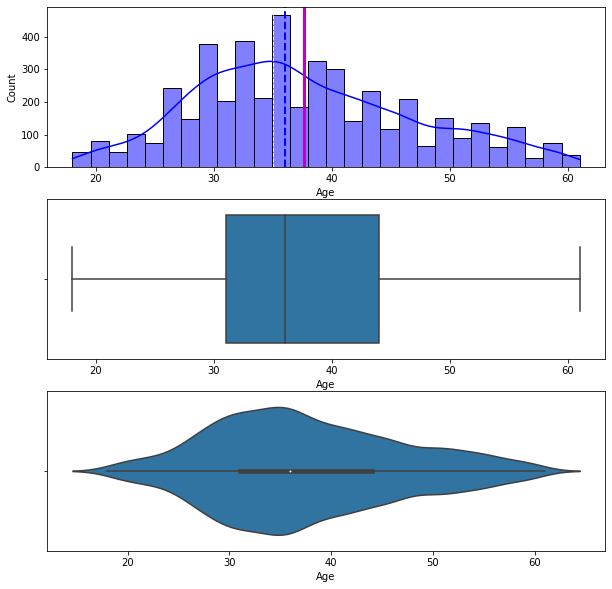

In [39]:
#View the distribution of the Age variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.histplot(x=Tour.Age,color="blue",kde=True);
plt.axvline(Tour["Age"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(Tour["Age"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(Tour["Age"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(x=Tour.Age);
plt.subplot(3,1,3)
sns.violinplot(x=Tour.Age);

Observations:
- Age variable appears to be normally distributed with mean at 37.6yrs and the median at 36yrs.
- The cuastomers' age range from 18years to 61 years.

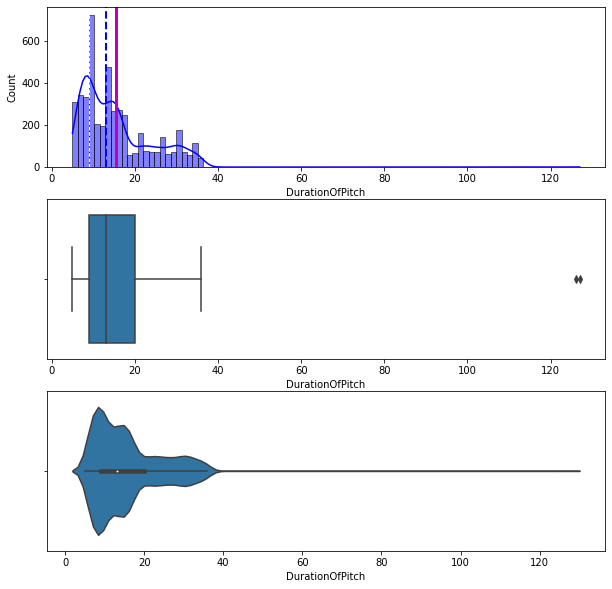

In [40]:
#View the distribution of the DurationOfPitch variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.histplot(x=Tour.DurationOfPitch,color="blue",kde=True);
plt.axvline(Tour["DurationOfPitch"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(Tour["DurationOfPitch"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(Tour["DurationOfPitch"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(x=Tour.DurationOfPitch);
plt.subplot(3,1,3)
sns.violinplot(x=Tour.DurationOfPitch);

Observations:
- DurationOfPitch variable has a mean of 15.4 and median value at 13.This indicates that variable is slightly right skewed.
- The histplot/graph indicates that the variable is highly right skewed with the outliers.
- There are 2 outliers at 127, which need to be addressed. 

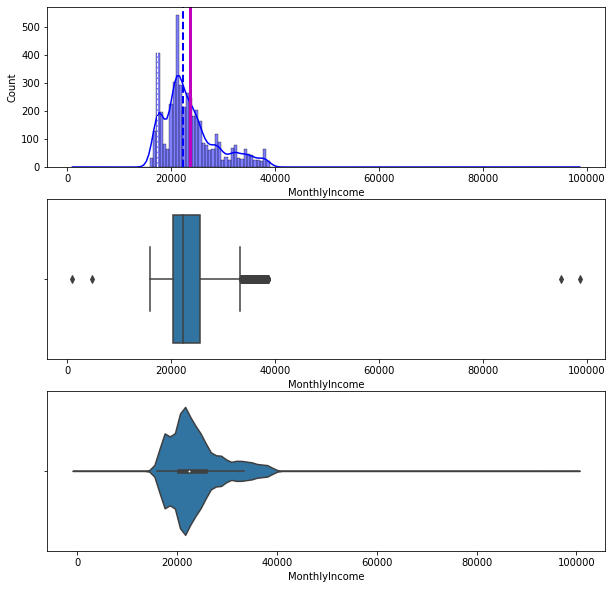

In [41]:
#View the distribution of the MonthlyIncome variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.histplot(x=Tour.MonthlyIncome,color="blue",kde=True);
plt.axvline(Tour["MonthlyIncome"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(Tour["MonthlyIncome"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(Tour["MonthlyIncome"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(x=Tour.MonthlyIncome);
plt.subplot(3,1,3)
sns.violinplot(x=Tour.MonthlyIncome);

Observations:
- MonthlyIncome variable has outliers both to the right and the left.   

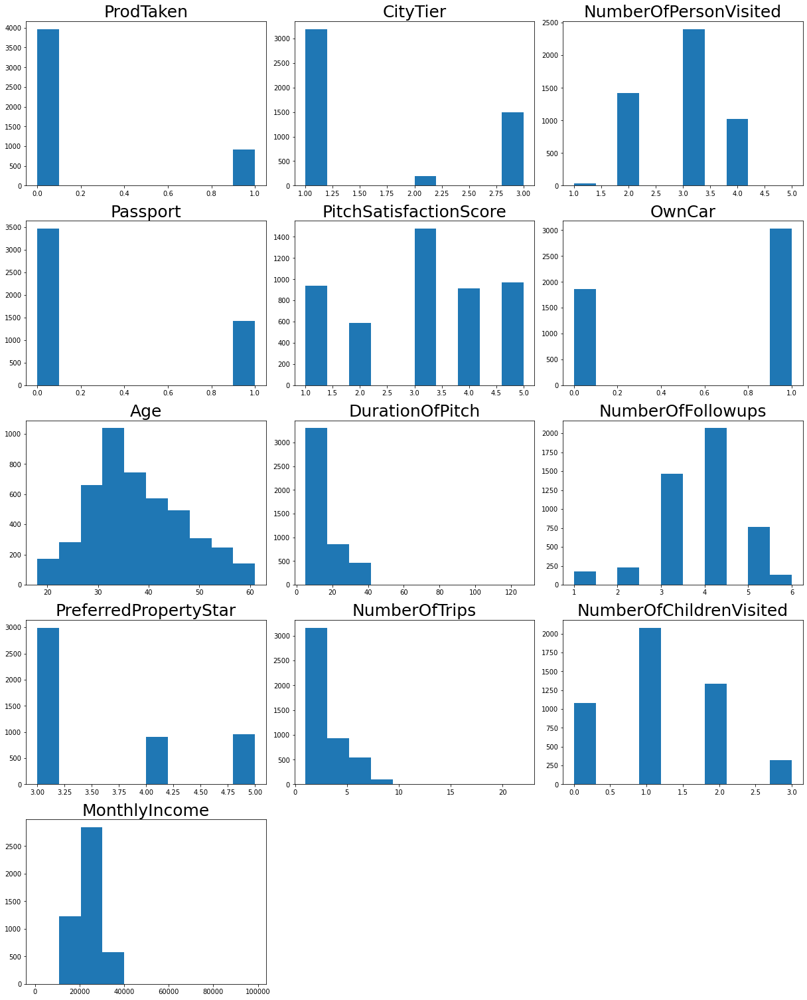

In [42]:
# lets plot histogram of all plots
from scipy.stats import norm
numeric_columns=['ProdTaken','CityTier','NumberOfPersonVisited','Passport','PitchSatisfactionScore','OwnCar','Age','DurationOfPitch','NumberOfFollowups','PreferredPropertyStar','NumberOfTrips','NumberOfChildrenVisited','MonthlyIncome']
plt.figure(figsize=(17,75))

for i in range(len(numeric_columns)):
    plt.subplot(18,3,i+1)
    plt.hist(Tour[numeric_columns[i]])
    plt.tight_layout()
    plt.title(numeric_columns[i],fontsize=25)
    

plt.show()

### View the plots for categorical variables

In [43]:
# Function to create barplots that indicate percentage for each category.
def bar_perc(plot, feature):
    '''
    plot
    feature: 1-d categorical feature array
    '''
    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 12) # annotate the percantage

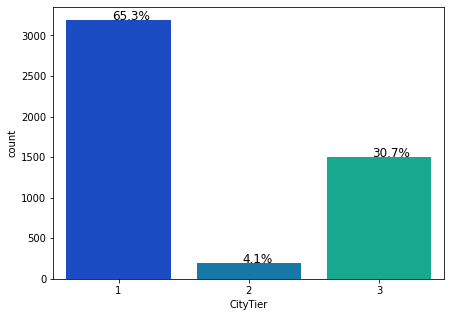

In [44]:
#View the countplot on CityTier size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["CityTier"],palette='winter');
bar_perc(ax,Tour["CityTier"])

Observations:
- There are more customers from CityTier-1, followed by CityTier-3 and then CityTier-2.
- More than 60% of the customers from CityTier1 can be attributed to the transportation facilities like air,train etc. But we need more information to confirm on this.

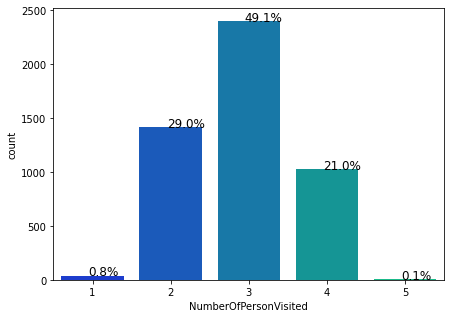

In [45]:
#View the countplot on NumberOfPersonVisited size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["NumberOfPersonVisited"],palette='winter');
bar_perc(ax,Tour["NumberOfPersonVisited"])

Observations:
- Most of the customers have 3 persons accompanying them, followed by 2 and 4 people.
- There are only a few customers that travel with 5 other people.
- There are few customers who like to travel with just one other person.

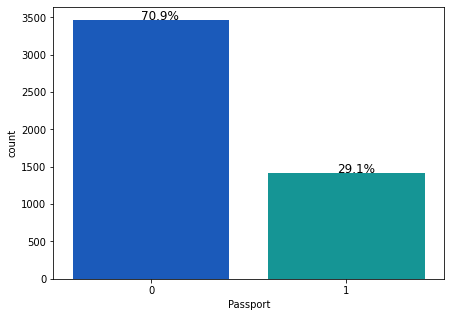

In [46]:
#View the countplot on Passport size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["Passport"],palette='winter');
bar_perc(ax,Tour["Passport"])

Observations:
- There are more customers without passport than passportholders.

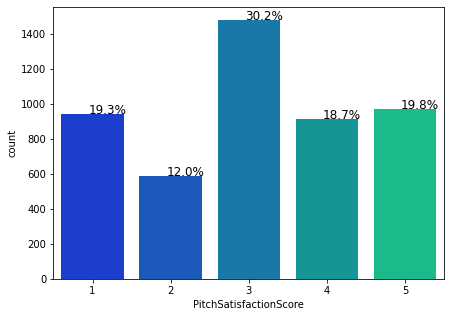

In [47]:
#View the countplot on PitchSatisfactionScore size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["PitchSatisfactionScore"],palette='winter');
bar_perc(ax,Tour["PitchSatisfactionScore"])

Observations:
- Most of the customers gave average and above average PitchSatisfactionScore.

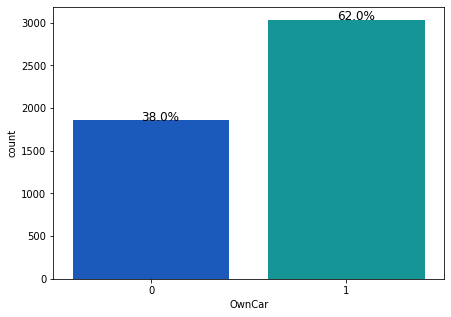

In [48]:
#View the countplot on OwnCar size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["OwnCar"],palette='winter');
bar_perc(ax,Tour["OwnCar"])

Observations:
- Around 62% of the customers own a car.

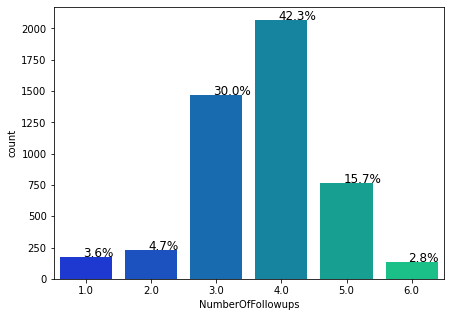

In [49]:
#View the countplot on NumberOfFollowups size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["NumberOfFollowups"],palette='winter');
bar_perc(ax,Tour["NumberOfFollowups"])

Observations:
- For most of the customers,  atleast 3-4 followups are being made after the sales pitch.

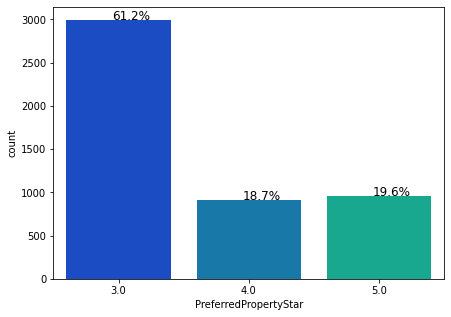

In [50]:
#View the countplot on PreferredPropertyStar size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["PreferredPropertyStar"],palette='winter');
bar_perc(ax,Tour["PreferredPropertyStar"])

Observations:
- Most of the customers prefer 3 star rated accomodation.   

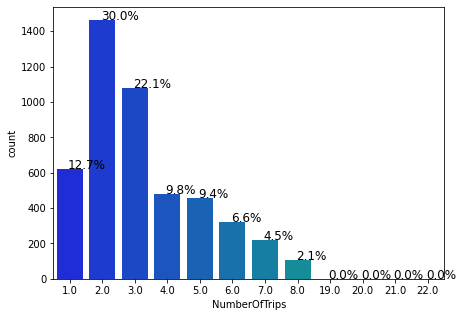

In [51]:
#View the countplot on NumberOfTrips size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["NumberOfTrips"],palette='winter');
bar_perc(ax,Tour["NumberOfTrips"])

Observations:
- Majority of the customers make either 2 or 3 trips per year. 
- 30% of the customers make 2 trips per year.
- There are few customers that make 19-22 trips per year. This could either be an error or they could be frequent flyers for their work.

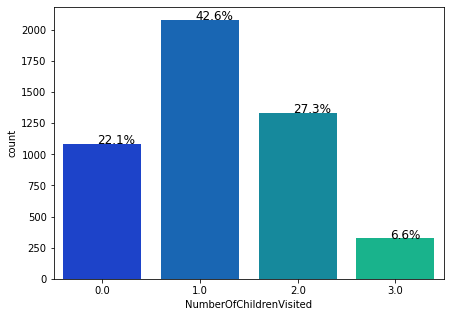

In [52]:
#View the countplot on NumberOfChildrenVisited size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["NumberOfChildrenVisited"],palette='winter');
bar_perc(ax,Tour["NumberOfChildrenVisited"])

Observations:
- Most of the customers travel with kids.
- Around 22% customers travel without kids.

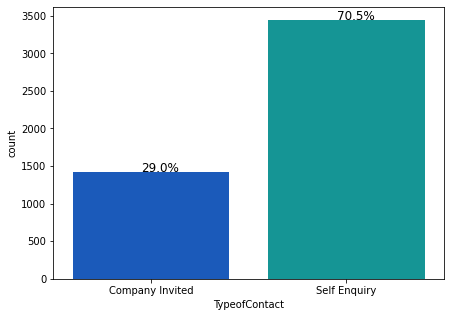

In [53]:
#View the countplot on TypeofContact size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["TypeofContact"],palette='winter');
bar_perc(ax,Tour["TypeofContact"])

Observations:
- Majority of the customers made self Enquiry to the Travel Agency.

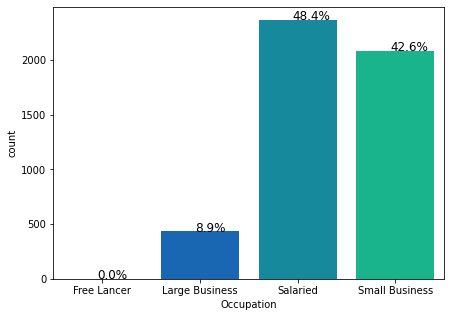

In [54]:
#View the countplot on Occupation size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["Occupation"],palette='winter');
bar_perc(ax,Tour["Occupation"])

Observations:
- Majority of the customers are either salaried or own a small business.

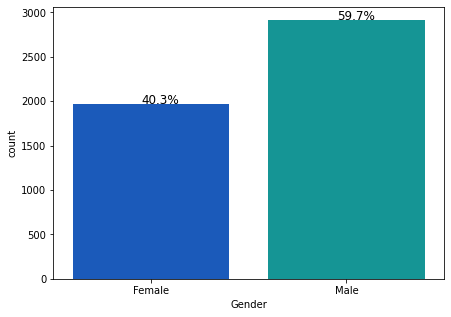

In [55]:
#View the countplot on Gender size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["Gender"],palette='winter');
bar_perc(ax,Tour["Gender"])

Observations:
- Majority of the customers are Male.

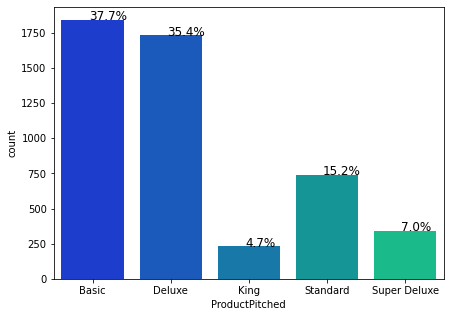

In [56]:
#View the countplot on ProductPitched size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["ProductPitched"],palette='winter');
bar_perc(ax,Tour["ProductPitched"])

Observations:
- Basic and Deluxe packages are more proposed compared to other packages offered by travel agency. This could be inline with the customers' budget.

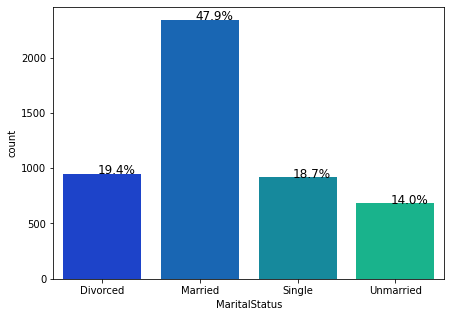

In [57]:
#View the countplot on MaritalStatus size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["MaritalStatus"],palette='winter');
bar_perc(ax,Tour["MaritalStatus"])

Observations:
- Almost 50% of the customers are married.

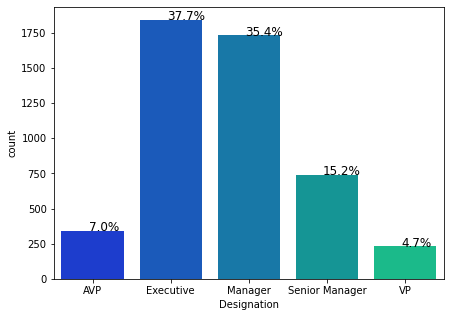

In [58]:
#View the countplot on Designation size
plt.figure(figsize=(7,5))
ax = sns.countplot(x=Tour["Designation"],palette='winter');
bar_perc(ax,Tour["Designation"])

Observations:
- Majority of the customers are either Executives or Managers.

## Bivariate analysis

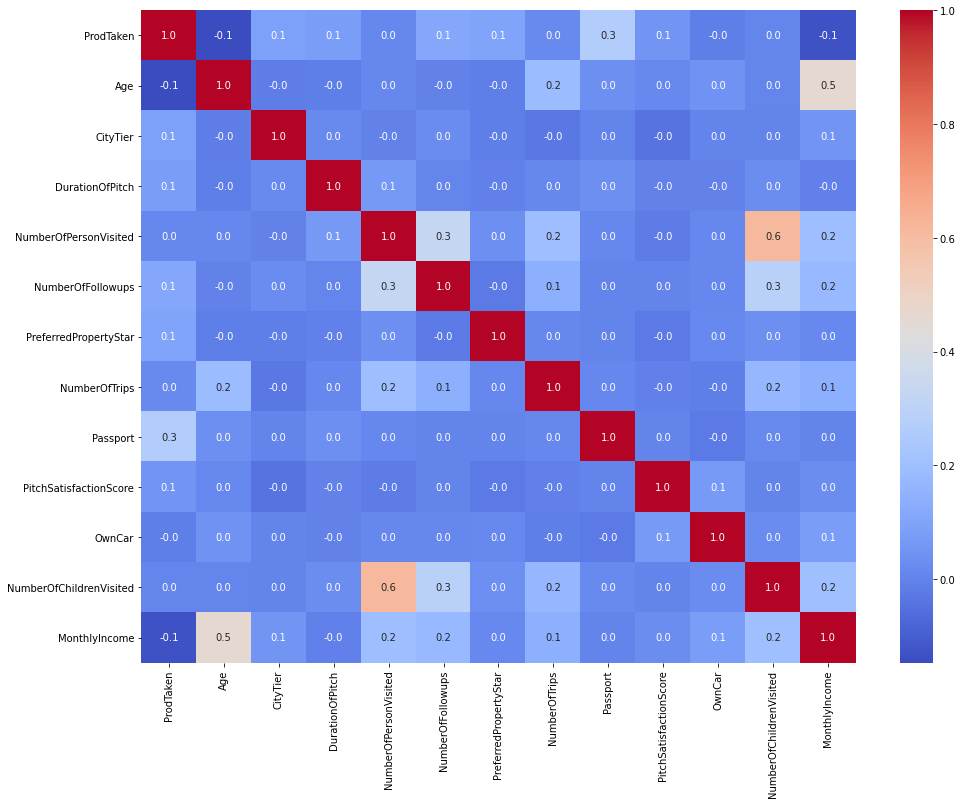

In [59]:
corr=Tour.corr()   
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True,cmap='coolwarm',
        fmt=".1f",
        xticklabels=corr.columns,
        yticklabels=corr.columns);

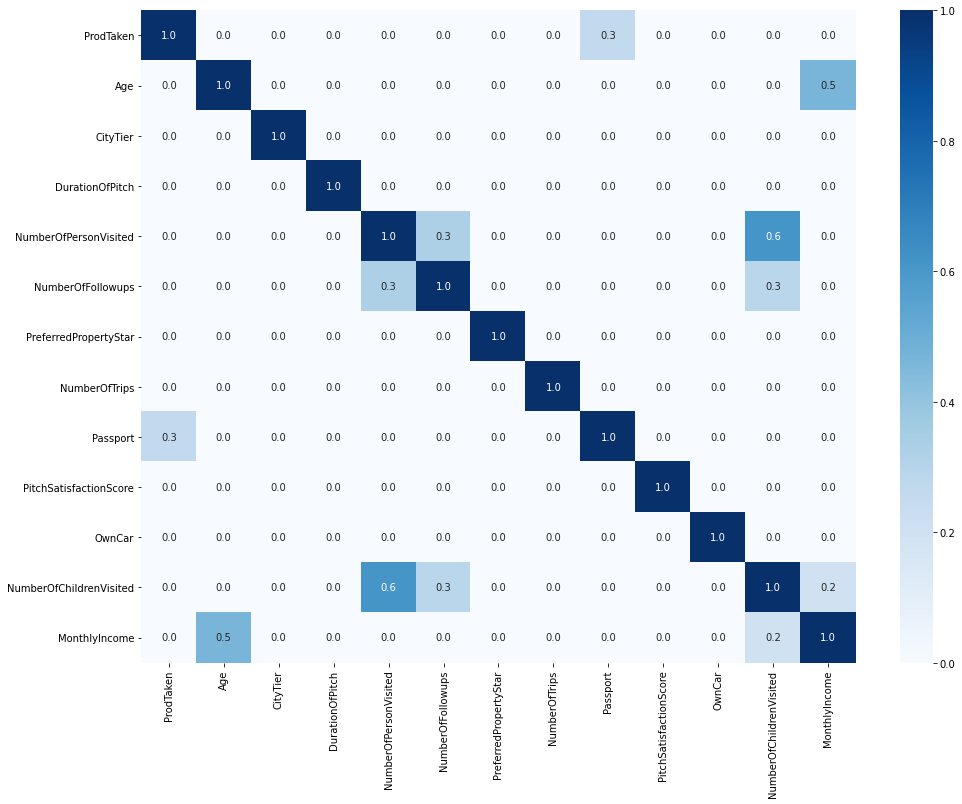

In [60]:
# View the heatmap by filtering out the correlations less than 0.5
corr=Tour.corr()  
corr[np.abs(corr)<0.2]=0
#matrix = np.triu(Tour.corr())
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True,cmap='Blues',
        fmt=".1f",
        xticklabels=corr.columns,
        yticklabels=corr.columns
        #,mask=matrix
           );

Observations:
- ProdTaken has a positive correlation with passport.
- Age and MonthlyIncome have a strong positive correlation.
- NumberOfFollowups and NumberofPersonVisited have a  positive correlation.
- NumberofPersonVisited and NumberofChildrenVisited show strong correlation with each other.

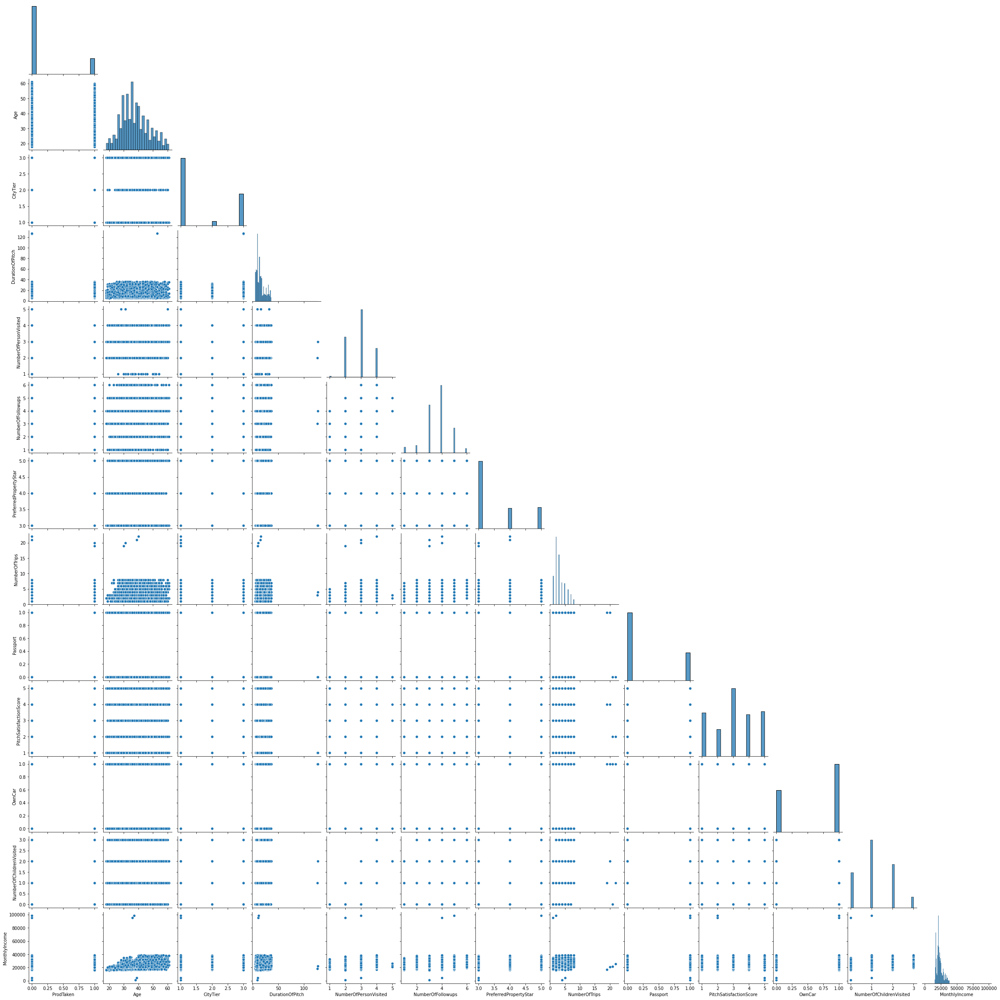

In [61]:
sns.pairplot(Tour, corner=True);

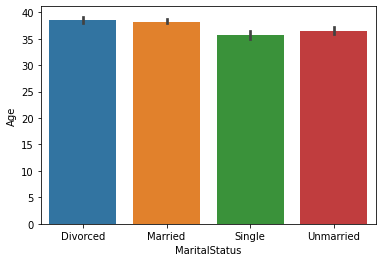

In [62]:
sns.barplot(x="MaritalStatus", y="Age", data=Tour);

Observations:
- The average age of Married and Divorced customers is slightly higher than Single and Unmarried customers.   

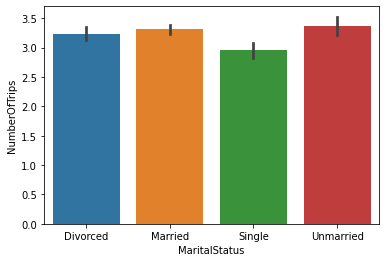

In [63]:
sns.barplot(x="MaritalStatus", y="NumberOfTrips", data=Tour);

Observations:
- The unmarried customers have taken slightly more number of trips compared to the other groups.

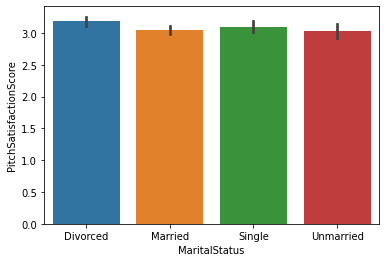

In [64]:
sns.barplot(x="MaritalStatus", y="PitchSatisfactionScore", data=Tour);

Observations:
- There is not much significant difference in the PitchSatisfactionScore by Married,Unamrried, Divorced or single customers.

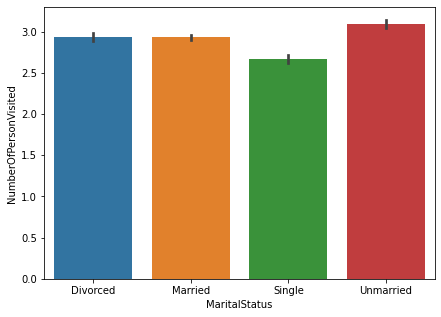

In [65]:
plt.figure(figsize=(7,5))
sns.barplot(x="MaritalStatus", y="NumberOfPersonVisited", data=Tour);

Observations:
- On anaverage,there are slighly more numberofpersons visited along with unmarried customers.

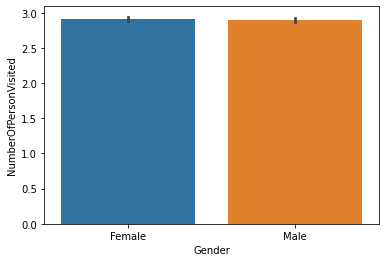

In [66]:
sns.barplot(x="Gender", y="NumberOfPersonVisited", data=Tour);

Observations:
- There is no significant difference in the NumberOfPersonVisited with the Gender.

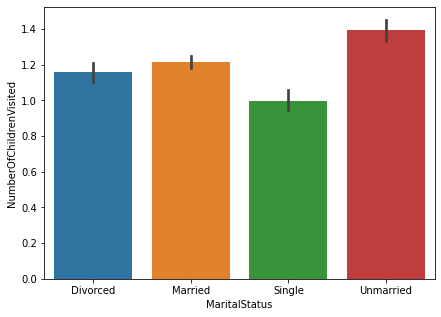

In [67]:
plt.figure(figsize=(7,5))
sns.barplot(x="MaritalStatus", y="NumberOfChildrenVisited", data=Tour);

Observations:
- On an average, there are slightly more NumberOfChildrenVisited along with the unmarried customers than married,Divorced and single customers.

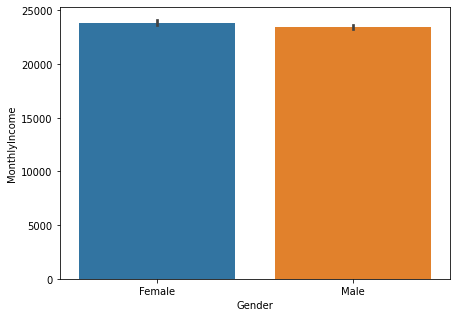

In [68]:
plt.figure(figsize=(7,5))
sns.barplot(x="Gender", y="MonthlyIncome", data=Tour);

Observations:
- No significant difference in the average income with respect toi gender.

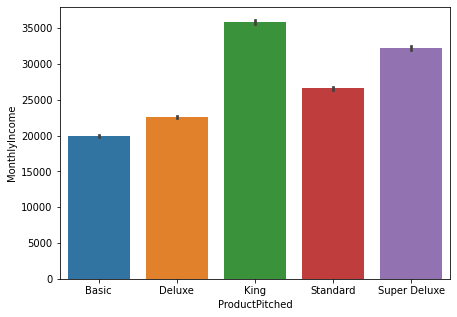

In [69]:
plt.figure(figsize=(7,5))
sns.barplot(x="ProductPitched", y="MonthlyIncome", data=Tour);

Observations:
The Monthly Income of the Customers to whom the King size package is proposed is highest.
The Packages are pitched in accordance with their salary. They are directly proportional

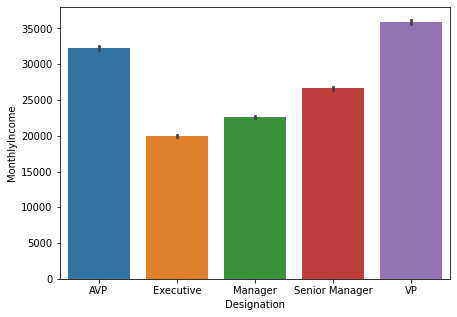

In [70]:
plt.figure(figsize=(7,5))
sns.barplot(x="Designation", y="MonthlyIncome", data=Tour);

Observations:
The salary of VP is the highest , followed by AVP,Senior Manager,Manager and Executive.


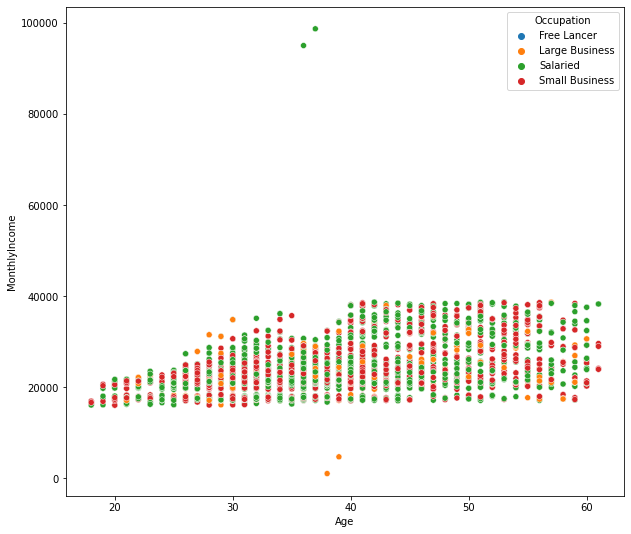

In [71]:
plt.figure(figsize=(10,9))
sns.scatterplot(x="Age", y="MonthlyIncome", hue="Occupation",data=Tour);

Observations:
- There are more salaried customers compared to other classes.
- There are more salaried,Small business customers at all ages.
- There are 2 outliers with highest salary and 2 other outliers with lowest monthly income for a large business customers. There 4 outliers seems to be inappropriate and needs to be taken care of.

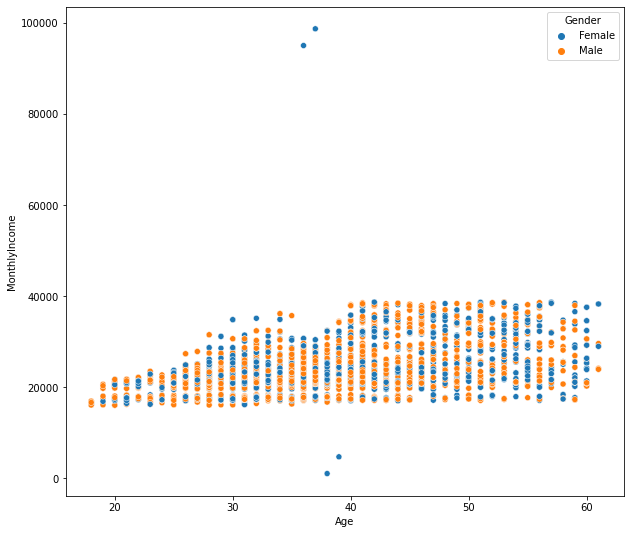

In [72]:
plt.figure(figsize=(10,9))
sns.scatterplot(x="Age", y="MonthlyIncome", hue="Gender",data=Tour);

Observations-
- The 4 outliers of monthly income are for Female customers.

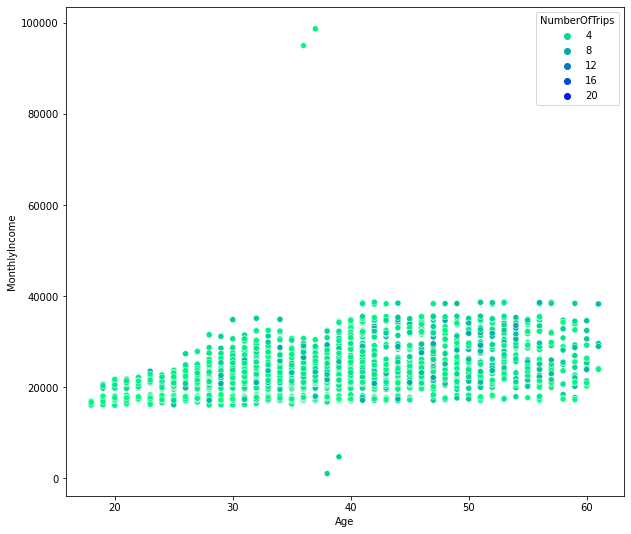

In [73]:
plt.figure(figsize=(10,9))
sns.scatterplot(x="Age", y="MonthlyIncome", hue="NumberOfTrips",data=Tour,palette='winter_r');

Observations:
- There are customers who makes more than 12 trips an year. According to the data, these customers are making trips irrespective of their salary.

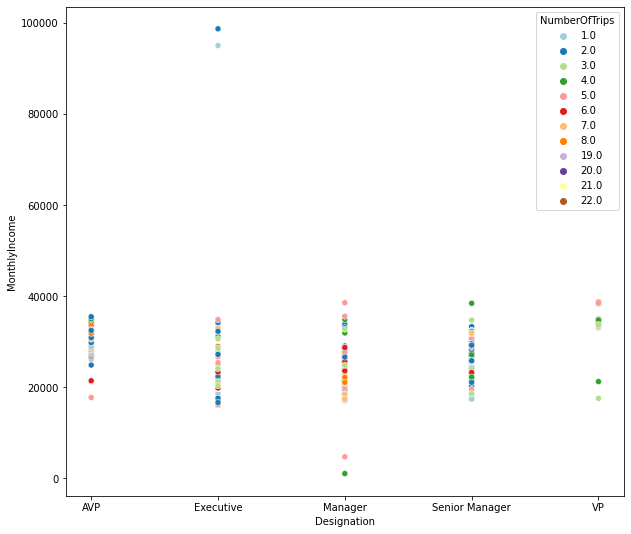

In [74]:
plt.figure(figsize=(10,9))
sns.scatterplot(x="Designation", y="MonthlyIncome", hue="NumberOfTrips",data=Tour,palette='Paired');

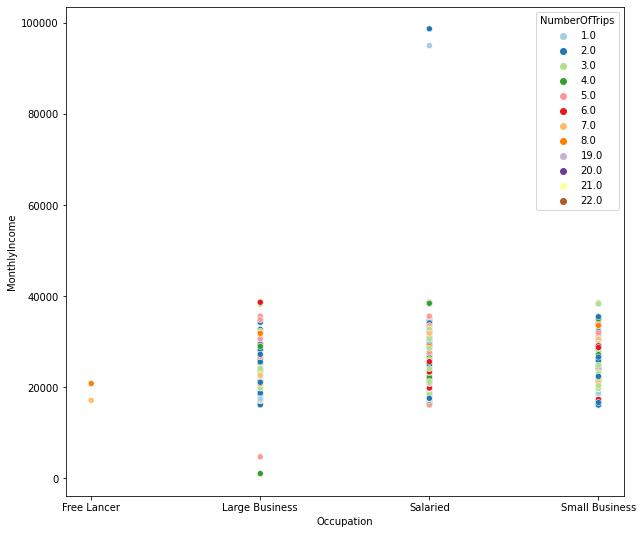

In [75]:
plt.figure(figsize=(10,9))
sns.scatterplot(x="Occupation", y="MonthlyIncome", hue="NumberOfTrips",data=Tour,palette='Paired');

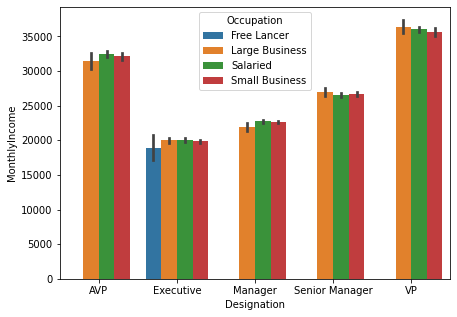

In [76]:
plt.figure(figsize=(7,5))
sns.barplot(x="Designation", y="MonthlyIncome", hue="Occupation", data=Tour);

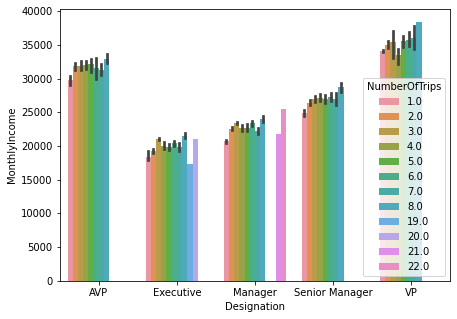

In [77]:
plt.figure(figsize=(7,5))
sns.barplot(x="Designation", y="MonthlyIncome", hue="NumberOfTrips", data=Tour);

Observations:
- There are Customers who are managers and executives that are making more than 19trips per year. This could be a data error and needs to be fixed.

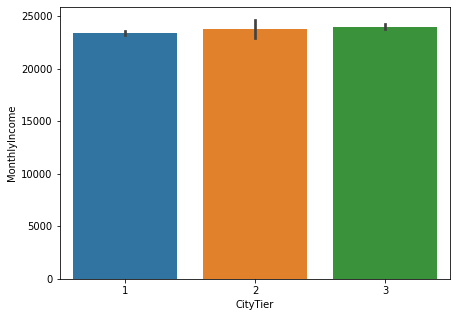

In [78]:
plt.figure(figsize=(7,5))
sns.barplot(x="CityTier", y="MonthlyIncome", data=Tour);

Observations:
- There is not much significant difference in the monthly income of customers from City Tier 1,2 & 3.

In [79]:
Tour.columns

Index(['ProdTaken', 'Age', 'TypeofContact', 'CityTier', 'DurationOfPitch',
       'Occupation', 'Gender', 'NumberOfPersonVisited', 'NumberOfFollowups',
       'ProductPitched', 'PreferredPropertyStar', 'MaritalStatus',
       'NumberOfTrips', 'Passport', 'PitchSatisfactionScore', 'OwnCar',
       'NumberOfChildrenVisited', 'Designation', 'MonthlyIncome'],
      dtype='object')

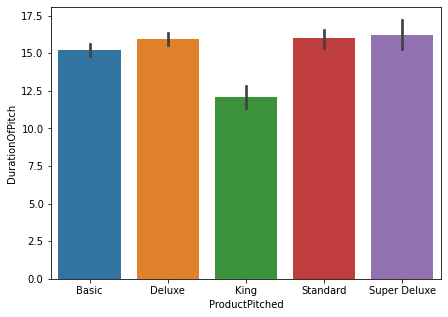

In [80]:
plt.figure(figsize=(7,5))
sns.barplot(x="ProductPitched", y="DurationOfPitch", data=Tour);

Observations:
- The King Package is promoted less compared to other packages. It could be expensive and maybe not all customers would prefer that.
- The standard, Deluxe and super Deluxe are promoted equally and Basic is slightly lesser. It could be due it price and offerings being closer.


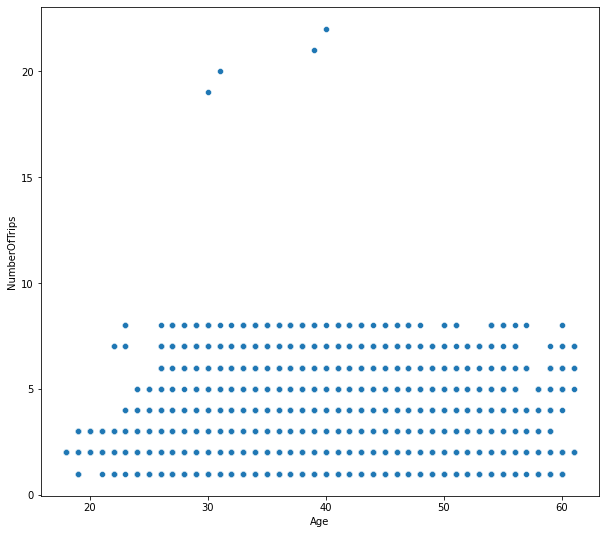

In [81]:
plt.figure(figsize=(10,9))
sns.scatterplot(x="Age", y="NumberOfTrips",data=Tour,palette='Paired');

Observations:
- The number of trips and age doesnt show any correlation.No definite pattern is observed.
    

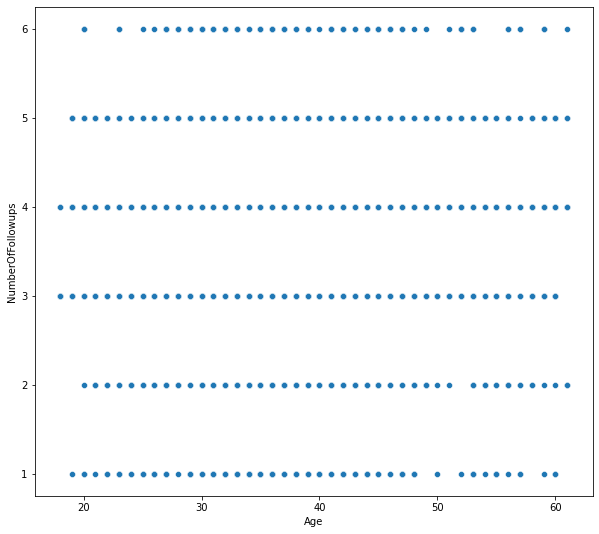

In [82]:
plt.figure(figsize=(10,9))
sns.scatterplot(x="Age", y="NumberOfFollowups",data=Tour);

Observations:
- The number of Followups and age doesn’t show any correlation.No definite pattern is observed.

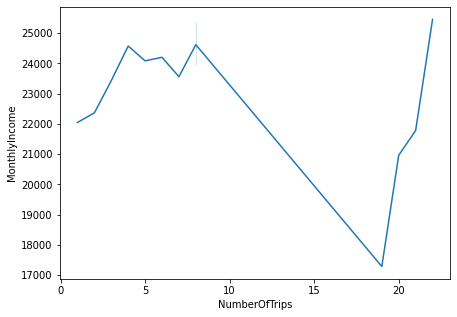

In [83]:
plt.figure(figsize=(7,5))
sns.lineplot(x="NumberOfTrips", y="MonthlyIncome", data=Tour);

Observations:
- The Number of Trips showed some positive correlation with monthlyincome until 9 trips. After that it dropped. The trips after 9 could be outliers and should be treated.

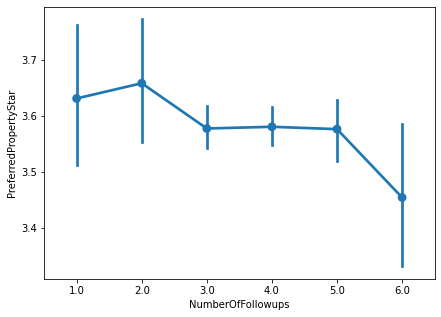

In [84]:
plt.figure(figsize=(7,5))
sns.pointplot(x="NumberOfFollowups", y="PreferredPropertyStar", data=Tour);

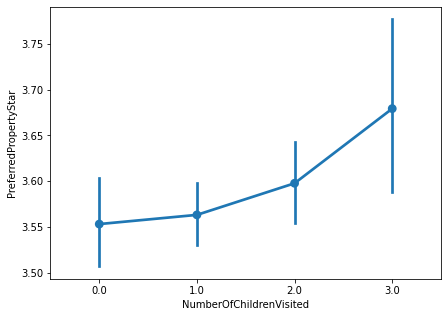

In [85]:
plt.figure(figsize=(7,5))
sns.pointplot(x="NumberOfChildrenVisited", y="PreferredPropertyStar", data=Tour);

Observations:
- The NumberofChildrenVisited shows a slight positive correlation with propertystar.

In [86]:
## Function to plot stacked bar chart
def stacked_plot(x):
    sns.set(palette='nipy_spectral')
    tab1 = pd.crosstab(x,Tour['ProdTaken'],margins=True)
    print(tab1)
    print('-'*120)
    tab = pd.crosstab(x,Tour['ProdTaken'],normalize='index')
    tab.plot(kind='bar',stacked=True,figsize=(10,5))
    plt.show()

ProdTaken     0    1   All
CityTier                  
1          2670  520  3190
2           152   46   198
3          1146  354  1500
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


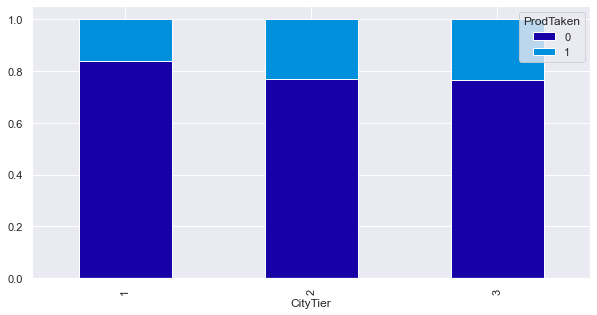

In [87]:
stacked_plot(Tour['CityTier'])

There are more customers from City Tier 2&3 buying trvael packages compared to City Tier 1.

ProdTaken           0    1   All
TypeofContact                   
Company Invited  1109  310  1419
Self Enquiry     2837  607  3444
All              3946  917  4863
------------------------------------------------------------------------------------------------------------------------


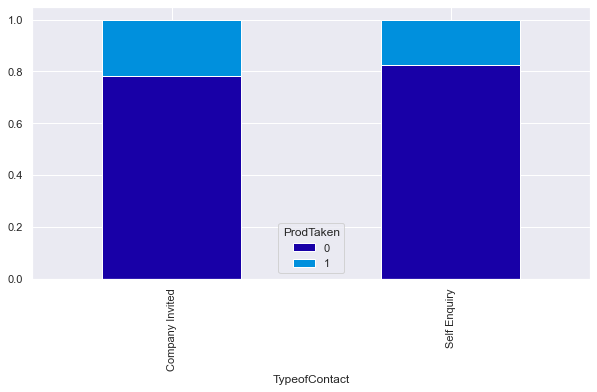

In [88]:
stacked_plot(Tour['TypeofContact'])

There are more company invited customers taking the travel packages than Self Enquiry.

ProdTaken          0    1   All
Occupation                     
Free Lancer        0    2     2
Large Business   314  120   434
Salaried        1954  414  2368
Small Business  1700  384  2084
All             3968  920  4888
------------------------------------------------------------------------------------------------------------------------


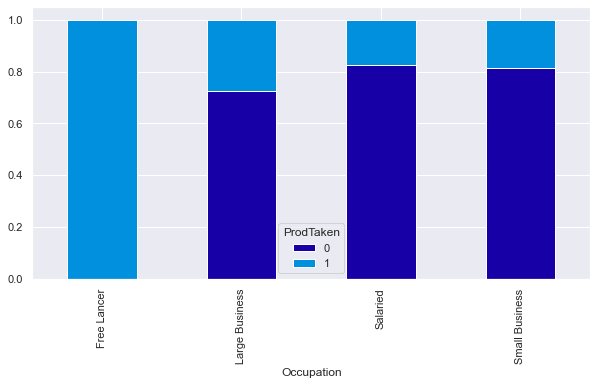

In [89]:
stacked_plot(Tour['Occupation'])

There is more probablilty for customers who own large business to take the travel package.

ProdTaken     0    1   All
Gender                    
Female     1630  342  1972
Male       2338  578  2916
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


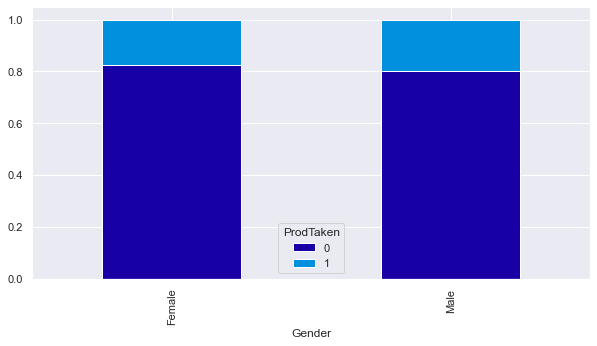

In [90]:
stacked_plot(Tour['Gender'])

Not much significant difference is observed between Female and Male.

ProdTaken          0    1   All
ProductPitched                 
Basic           1290  552  1842
Deluxe          1528  204  1732
King             210   20   230
Standard         618  124   742
Super Deluxe     322   20   342
All             3968  920  4888
------------------------------------------------------------------------------------------------------------------------


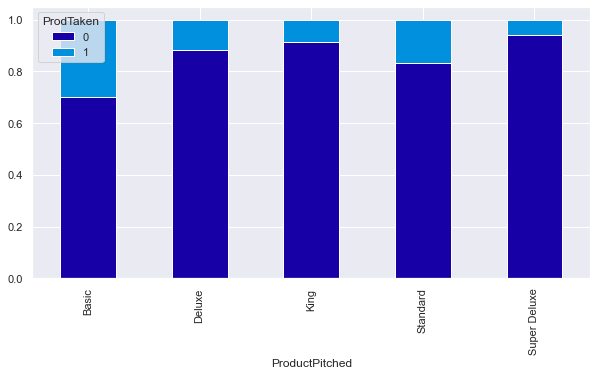

In [91]:
stacked_plot(Tour['ProductPitched'])

Basic Travel Package is sold more compared to other packages.

ProdTaken         0    1   All
MaritalStatus                 
Divorced        826  124   950
Married        2014  326  2340
Single          612  304   916
Unmarried       516  166   682
All            3968  920  4888
------------------------------------------------------------------------------------------------------------------------


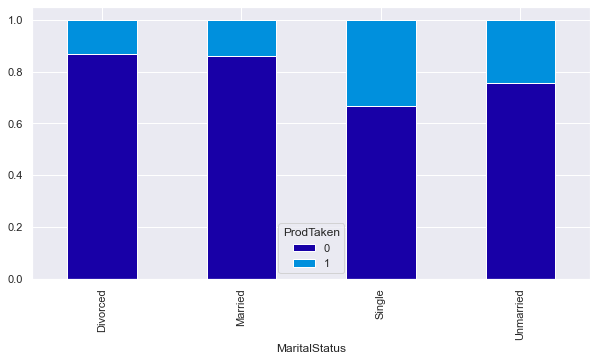

In [92]:
stacked_plot(Tour['MaritalStatus'])

There are more single customers buying the travel packages compared other customers.

ProdTaken          0    1   All
Designation                    
AVP              322   20   342
Executive       1290  552  1842
Manager         1528  204  1732
Senior Manager   618  124   742
VP               210   20   230
All             3968  920  4888
------------------------------------------------------------------------------------------------------------------------


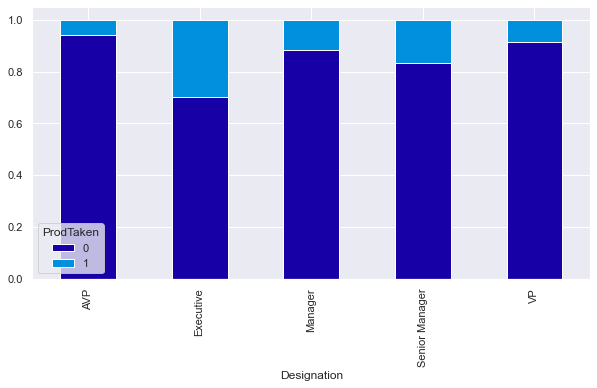

In [93]:
stacked_plot(Tour['Designation'])

More Executive customers are buying the travel packages.

ProdTaken                 0    1   All
NumberOfPersonVisited                 
1                        39    0    39
2                      1151  267  1418
3                      1942  460  2402
4                       833  193  1026
5                         3    0     3
All                    3968  920  4888
------------------------------------------------------------------------------------------------------------------------


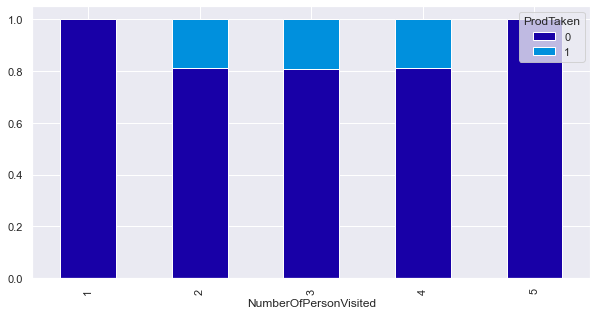

In [94]:
stacked_plot(Tour['NumberOfPersonVisited'])

There are equal probabilities for the Customers who visited office with 2,3&4 to buy the travel packages.
Customers who visited office with 1 and 5 persons didnt seems to make any trips.

ProdTaken     0    1   All
Passport                  
0          3040  426  3466
1           928  494  1422
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


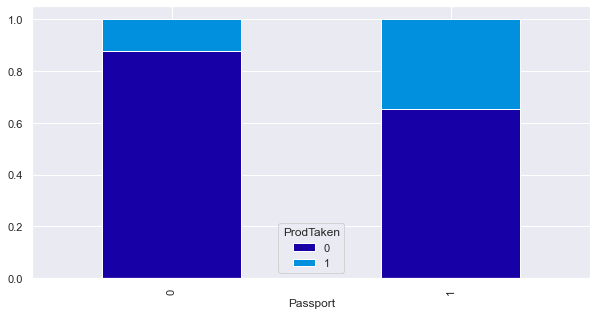

In [95]:
stacked_plot(Tour['Passport'])

Customers with passport are buying the travel packages more than customers without passport.

ProdTaken                  0    1   All
PitchSatisfactionScore                 
1                        798  144   942
2                        498   88   586
3                       1162  316  1478
4                        750  162   912
5                        760  210   970
All                     3968  920  4888
------------------------------------------------------------------------------------------------------------------------


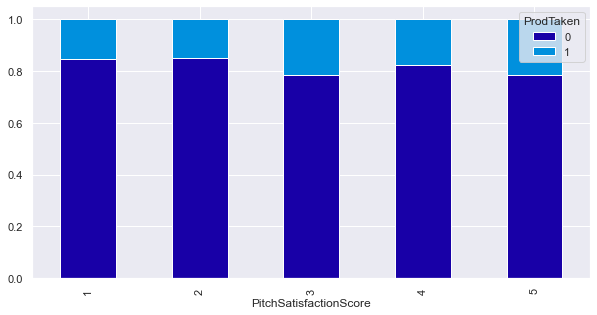

In [96]:
stacked_plot(Tour['PitchSatisfactionScore'])

PitchSatisfactionScore doesnt seem to have major impact on product taken.
Customers who gave 3 rating made more trips compared to others.

ProdTaken     0    1   All
OwnCar                    
0          1496  360  1856
1          2472  560  3032
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


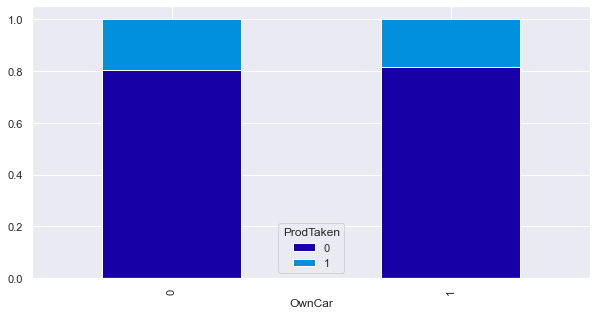

In [97]:
stacked_plot(Tour['OwnCar'])

Car ownership doesnt seem to have an impact on Product Taken.

ProdTaken             0    1   All
NumberOfFollowups                 
1.0                 156   20   176
2.0                 205   24   229
3.0                1222  244  1466
4.0                1689  379  2068
5.0                 577  191   768
6.0                  82   54   136
All                3931  912  4843
------------------------------------------------------------------------------------------------------------------------


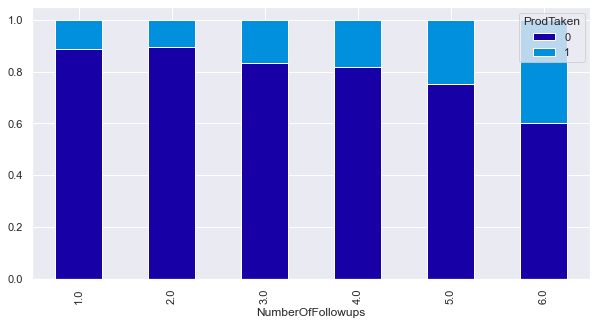

In [98]:
stacked_plot(Tour['NumberOfFollowups'])

There is a direct relationship with product taken and the followups.
As the followups increase, the chances of customers taking the travel package also increase.

ProdTaken                 0    1   All
PreferredPropertyStar                 
3.0                    2511  482  2993
4.0                     731  182   913
5.0                     706  250   956
All                    3948  914  4862
------------------------------------------------------------------------------------------------------------------------


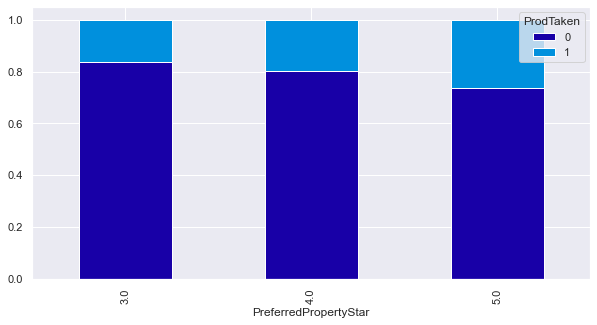

In [99]:
stacked_plot(Tour['PreferredPropertyStar'])

Customers who prefer 5 star property are more likely to get the travel package.

ProdTaken         0    1   All
NumberOfTrips                 
1.0             508  112   620
2.0            1165  299  1464
3.0             862  217  1079
4.0             417   61   478
5.0             396   62   458
6.0             258   64   322
7.0             156   62   218
8.0              76   29   105
19.0              0    1     1
20.0              0    1     1
21.0              1    0     1
22.0              1    0     1
All            3840  908  4748
------------------------------------------------------------------------------------------------------------------------


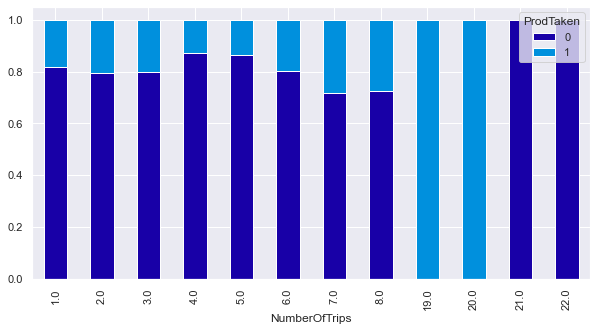

In [100]:
stacked_plot(Tour['NumberOfTrips'])

Those who make 7& 8 trips per year are more likely to buy the travel package.

ProdTaken                   0    1   All
NumberOfChildrenVisited                 
0.0                       880  202  1082
1.0                      1688  392  2080
2.0                      1082  253  1335
3.0                       259   66   325
All                      3909  913  4822
------------------------------------------------------------------------------------------------------------------------


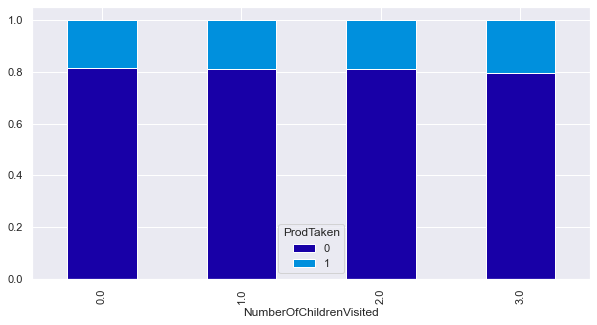

In [101]:
stacked_plot(Tour['NumberOfChildrenVisited'])

No Significant relation between the ProdTaken and Number of children visited.

### Key Observations - 
* CityTier,NumberOfPersonVisited,TypeofContact,Occupation,ProductPitched,MaritalStatus,Designation,Passport,PitchSatisfactionScore,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips appear to be very strong indicators of buying the travel package.
* Other factors appear to be not very good indicators of of taking the travel package. (We can use chi-square tests to determine statistical significance in the association between two categorical variables).


### Let us check which of these differences are statistically significant.

The Chi-Square test is a statistical method to determine if two categorical variables have a significant correlation between them.
  
**Null Hypothesis -** There is no association between the two variables.      
**Alternate Hypothesis -** There is an association between two variables.

In [102]:
crosstab = pd.crosstab(Tour['CityTier'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "CityTier has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "CityTier has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

CityTier has an effect on ProdTaken as the p_value (0.0) < 0.05


In [103]:
crosstab = pd.crosstab(Tour['NumberOfPersonVisited'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "NumberOfPersonVisited has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "NumberOfPersonVisited has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

NumberOfPersonVisited has an effect on ProdTaken as the p_value (0.042) < 0.05


In [104]:
crosstab = pd.crosstab(Tour['Passport'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "Passport has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "Passport has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Passport has an effect on ProdTaken as the p_value (0.0) < 0.05


In [105]:
crosstab = pd.crosstab(Tour['PitchSatisfactionScore'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "PitchSatisfactionScore has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "PitchSatisfactionScore has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

PitchSatisfactionScore has an effect on ProdTaken as the p_value (0.0) < 0.05


In [106]:
crosstab = pd.crosstab(Tour['OwnCar'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "OwnCar has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "OwnCar has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

OwnCar has no effect on ProdTaken as the p_value (0.443) > 0.05


In [107]:
crosstab = pd.crosstab(Tour['NumberOfFollowups'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "NumberOfFollowups has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "NumberOfFollowups has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

NumberOfFollowups has an effect on ProdTaken as the p_value (0.0) < 0.05


In [108]:
crosstab = pd.crosstab(Tour['PreferredPropertyStar'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "PreferredPropertyStar has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "PreferredPropertyStar has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

PreferredPropertyStar has an effect on ProdTaken as the p_value (0.0) < 0.05


In [109]:
crosstab = pd.crosstab(Tour['NumberOfTrips'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "NumberOfTrips has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "NumberOfTrips has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

NumberOfTrips has an effect on ProdTaken as the p_value (0.0) < 0.05


In [110]:
crosstab = pd.crosstab(Tour['NumberOfChildrenVisited'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "NumberOfChildrenVisited has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "NumberOfChildrenVisited has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

NumberOfChildrenVisited has no effect on ProdTaken as the p_value (0.928) > 0.05


In [111]:
crosstab = pd.crosstab(Tour['TypeofContact'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "TypeofContact has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "TypeofContact has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

TypeofContact has an effect on ProdTaken as the p_value (0.001) < 0.05


In [112]:
crosstab = pd.crosstab(Tour['Occupation'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "Occupation has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "Occupation has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Occupation has an effect on ProdTaken as the p_value (0.0) < 0.05


In [113]:
crosstab = pd.crosstab(Tour['Gender'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "Gender has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "Gender has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Gender has an effect on ProdTaken as the p_value (0.033) < 0.05


In [114]:
crosstab = pd.crosstab(Tour['ProductPitched'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "ProductPitched has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "ProductPitched has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

ProductPitched has an effect on ProdTaken as the p_value (0.0) < 0.05


In [115]:
crosstab = pd.crosstab(Tour['MaritalStatus'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "MaritalStatus has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "MaritalStatus has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

MaritalStatus has an effect on ProdTaken as the p_value (0.0) < 0.05


In [116]:
crosstab = pd.crosstab(Tour['Designation'],Tour['ProdTaken'])  # Contingency table of region and smoker attributes

Ho = "Designation has no effect on ProdTaken"   # Stating the Null Hypothesis
Ha = "Designation has an effect on ProdTaken"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Designation has an effect on ProdTaken as the p_value (0.0) < 0.05


### Relation between ProductPitched vs other independent variables

In [117]:
## Function to plot stacked bar chart
def stacked_plot_Product(x):
    sns.set(palette='nipy_spectral')
    tab1 = pd.crosstab(x,Tour['ProductPitched'],margins=True)
    print(tab1)
    print('-'*120)
    tab = pd.crosstab(x,Tour['ProductPitched'],normalize='index')
    tab.plot(kind='bar',stacked=True,figsize=(10,5))
    plt.show()

ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
Age                                                              
18.0               14       0     0         0             0    14
19.0               31       0     0         1             0    32
20.0               37       0     0         1             0    38
21.0               40       1     0         0             0    41
22.0               43       3     0         0             0    46
23.0               41       5     0         0             0    46
24.0               46      10     0         0             0    56
25.0               43      31     0         0             0    74
26.0               61      44     0         1             0   106
27.0               83      45     1         9             0   138
28.0               91      43     1        12             0   147
29.0              109      52     0        16             1   178
30.0              105      67     0        26             1   199
31.0      

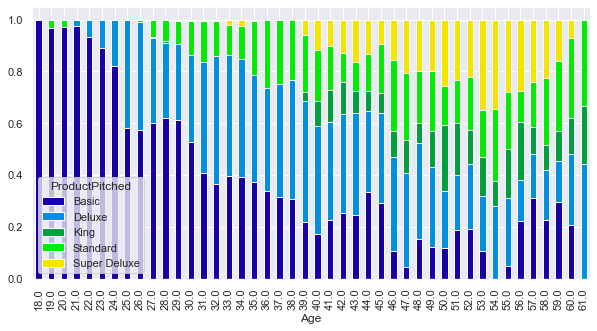

In [118]:
stacked_plot_Product(Tour['Age'])

- Basic Package is pitched more to customers of age below 25.
- Deluxe and standard packages are pitched more to customers aged above 25 and 27 respectively.
- Super Deluxe and King are pitched to customers aged above 39.

In [119]:
# Statistical significance of the relation between Age and ProductPitched
crosstab = pd.crosstab(Tour['Age'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "Age has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "Age has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Age has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
Passport                                                         
0                1274    1252   170       532           238  3466
1                 568     480    60       210           104  1422
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


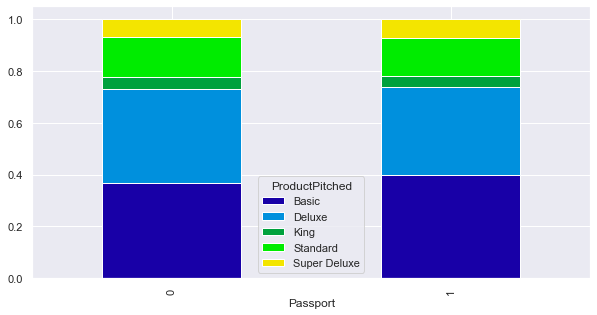

In [120]:
stacked_plot_Product(Tour['Passport'])

Passport doesnt seem to have any impact of product pitched.

In [121]:
# Statistical significance of the relation between Passport and ProductPitched
crosstab = pd.crosstab(Tour['Passport'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "Passport has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "Passport has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Passport has no effect on ProductPitched as the p_value (0.212) > 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
CityTier                                                         
1                1466     908   168       436           212  3190
2                 108      40    22        18            10   198
3                 268     784    40       288           120  1500
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


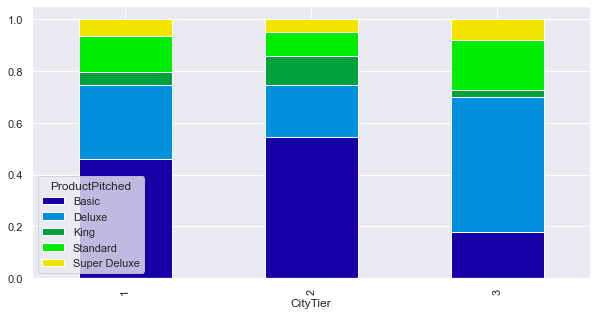

In [122]:
stacked_plot_Product(Tour['CityTier'])

* Basic package is recommended more to City Tier1 and City Tier 2.
* Deluxe package is recommended more to City Tier 3 compared to others.
* Comapritively King Package is proposed more to City Tier 2 and Standard package is proposed more to City Tier 3 compared to others.

In [123]:
# Statistical significance of the relation between CityTier and ProductPitched
crosstab = pd.crosstab(Tour['CityTier'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "CityTier has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "CityTier has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

CityTier has an effect on ProductPitched as the p_value (0.0) < 0.05


In [124]:
## Function to plot stacked bar chart
def stacked_plot_City(x):
    sns.set(palette='nipy_spectral')
    tab1 = pd.crosstab(x,Tour['CityTier'],margins=True)
    print(tab1)
    print('-'*120)
    tab = pd.crosstab(x,Tour['CityTier'],normalize='index')
    tab.plot(kind='bar',stacked=True,figsize=(10,5))
    plt.show()
  

CityTier           1    2     3   All
Designation                          
AVP              212   10   120   342
Executive       1466  108   268  1842
Manager          908   40   784  1732
Senior Manager   436   18   288   742
VP               168   22    40   230
All             3190  198  1500  4888
------------------------------------------------------------------------------------------------------------------------


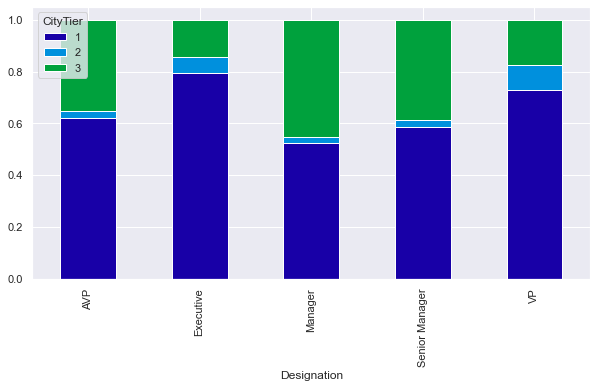

In [125]:
  stacked_plot_City(Tour['Designation'])

- There are more AVP's,VP's and Executives from City Tier 1.
- There are more VP customers from city Tier 2.
- There are more  Managers,Senior managers and AVP's living from City Tier 3.

In [126]:
# Statistical significance of the relation between Designation and ProductPitched
crosstab = pd.crosstab(Tour['Designation'],Tour['CityTier'])  # Contingency table of region and smoker attributes

Ho = "Designation has no effect on CityTier"   # Stating the Null Hypothesis
Ha = "Designation has an effect on CityTier"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Designation has an effect on CityTier as the p_value (0.0) < 0.05


CityTier           1    2     3   All
Occupation                           
Free Lancer        2    0     0     2
Large Business   298   16   120   434
Salaried        1682  138   548  2368
Small Business  1208   44   832  2084
All             3190  198  1500  4888
------------------------------------------------------------------------------------------------------------------------


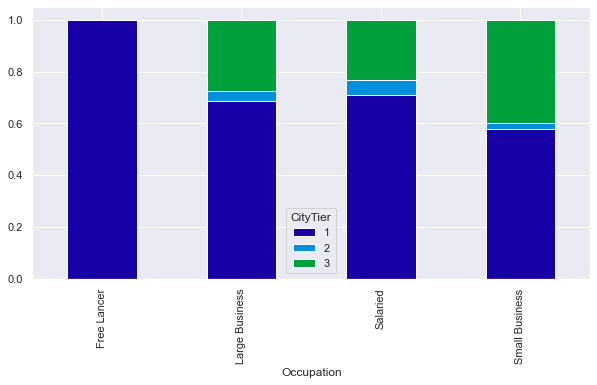

In [127]:
stacked_plot_City(Tour['Occupation'])

- There are more salaried customers in City Tier 1
- There are more small business customers in city Tier 3.

In [128]:
# Statistical significance of the relation between Occupation and ProductPitched
crosstab = pd.crosstab(Tour['Occupation'],Tour['CityTier'])  # Contingency table of region and smoker attributes

Ho = "Occupation has no effect on CityTier"   # Stating the Null Hypothesis
Ha = "Occupation has an effect on CityTier"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Occupation has an effect on CityTier as the p_value (0.0) < 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
NumberOfTrips                                                    
1.0               212     237    28       100            43   620
2.0               651     513    35       205            60  1464
3.0               492     368    20       154            45  1079
4.0               122     184    21        95            56   478
5.0               136     179    21        83            39   458
6.0               104     130    14        54            20   322
7.0                77      79     8        33            21   218
8.0                41      38     1        17             8   105
19.0                1       0     0         0             0     1
20.0                1       0     0         0             0     1
21.0                0       1     0         0             0     1
22.0                0       1     0         0             0     1
All              1837    1730   148       741           292  4748
----------

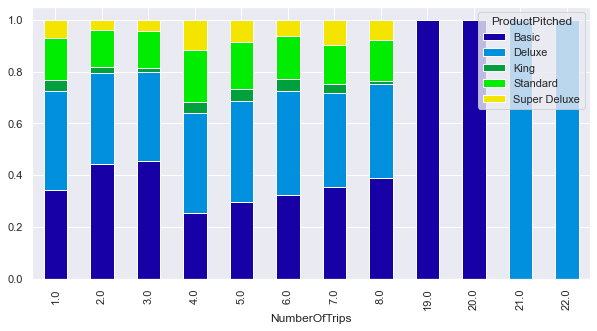

In [129]:
stacked_plot_Product(Tour['NumberOfTrips'])

- Basic and Deluxe model is recommended more to the customers who made 2 or 3 trips per annum. 
- Deluxe package is recommended more to the customers who made is 3-7 trips per annum.


In [130]:
# Statistical significance of the relation between NumberOfTrips and ProductPitched
crosstab = pd.crosstab(Tour['NumberOfTrips'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "NumberOfTrips has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "NumberOfTrips has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

NumberOfTrips has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched   Basic  Deluxe  King  Standard  Super Deluxe   All
DurationOfPitch                                                   
5.0                  1       1     2         2             0     6
6.0                121      89    20        54            23   307
7.0                128     118    18        55            23   342
8.0                138     100    25        31            39   333
9.0                192     155    31        52            53   483
10.0                96      75    18        38            17   244
11.0                76      71    21        33             4   205
12.0                82      62    12        30             9   195
13.0                80      73    14        46            10   223
14.0                82      88    14        59            10   253
15.0               116      91     8        42            12   269
16.0               126      81    10        46            11   274
17.0                57      61     7        36            11  

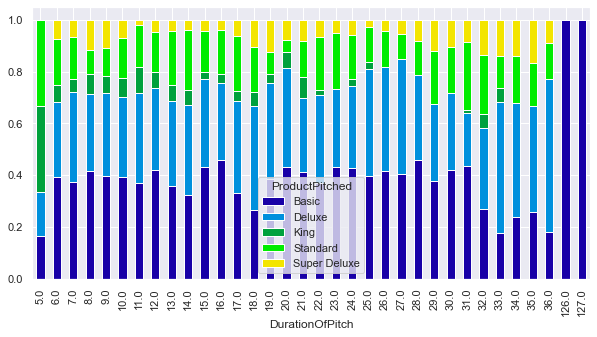

In [131]:
stacked_plot_Product(Tour['DurationOfPitch'])

Duration of the pitch is more for Basic and Deluxe packages

In [132]:
# Statistical significance of the relation between DurationOfPitch and ProductPitched
crosstab = pd.crosstab(Tour['DurationOfPitch'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "DurationOfPitch has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "DurationOfPitch has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

DurationOfPitch has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
MaritalStatus                                                    
Divorced          332     336    52       142            88   950
Married           816     852   126       380           166  2340
Single            511     221    52        50            82   916
Unmarried         183     323     0       170             6   682
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


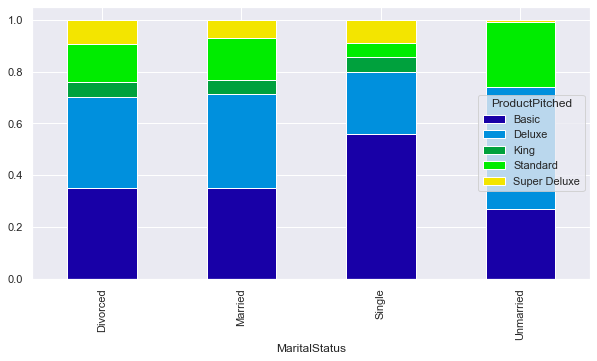

In [133]:
stacked_plot_Product(Tour['MaritalStatus'])

- Basic package is pitched more to singles compared to others.
- Deluxe package is pitched more to unmarried customers.
- King and super deluxe package is not pitched to unamarried customers.
- Standard package is pitched more to Married and Divorced.

In [134]:
# Statistical significance of the relation between MaritalStatus and ProductPitched
crosstab = pd.crosstab(Tour['MaritalStatus'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "MaritalStatus has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "MaritalStatus has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

MaritalStatus has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
Designation                                                      
AVP                 0       0     0         0           342   342
Executive        1842       0     0         0             0  1842
Manager             0    1732     0         0             0  1732
Senior Manager      0       0     0       742             0   742
VP                  0       0   230         0             0   230
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


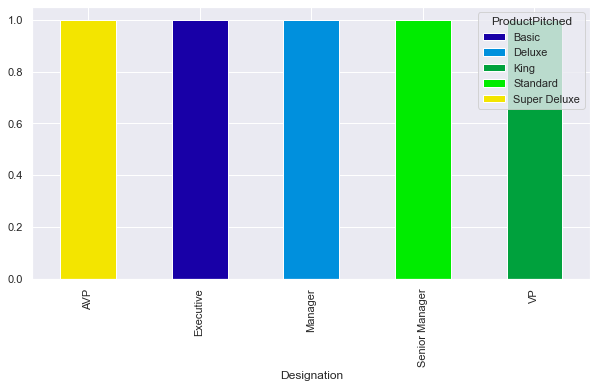

In [135]:
stacked_plot_Product(Tour['Designation'])

- We observe exclusivity in the packages that are recommended to the customers based on their designation and salary.
- Executives are recommended Basic packages, Managers with Deluxe, Senior managers with Standard, AVPs with Super Deluxe and VPs are recommended King packages.


In [136]:
# Statistical significance of the relation between Designation and ProductPitched
crosstab = pd.crosstab(Tour['Designation'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "Designation has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "Designation has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Designation has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
Occupation                                                       
Free Lancer         2       0     0         0             0     2
Large Business    196     124    12        84            18   434
Salaried          924     818   114       338           174  2368
Small Business    720     790   104       320           150  2084
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


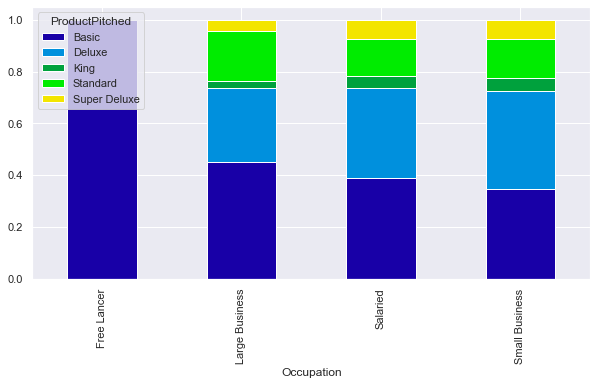

In [137]:
stacked_plot_Product(Tour['Occupation'])

In [138]:
# Statistical significance of the relation between Occupation and ProductPitched
crosstab = pd.crosstab(Tour['Occupation'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "Occupation has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "Occupation has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Occupation has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched   Basic  Deluxe  King  Standard  Super Deluxe   All
TypeofContact                                                     
Company Invited    516     541    48       218            96  1419
Self Enquiry      1316    1176   182       524           246  3444
All               1832    1717   230       742           342  4863
------------------------------------------------------------------------------------------------------------------------


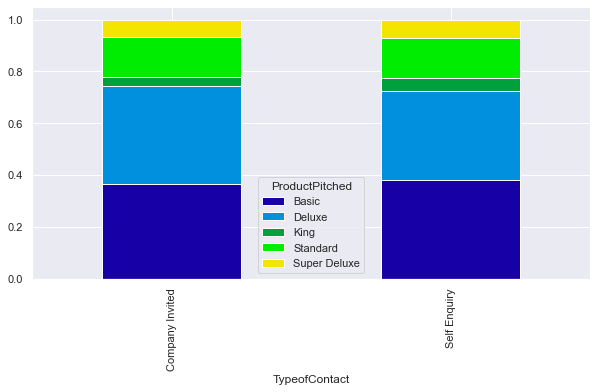

In [139]:
stacked_plot_Product(Tour['TypeofContact'])

Type of Contact doesnt see to have any impact on product pitched.

In [140]:
# Statistical significance of the relation between TypeofContact and ProductPitched
crosstab = pd.crosstab(Tour['TypeofContact'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "TypeofContact has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "TypeofContact has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

TypeofContact has an effect on ProductPitched as the p_value (0.01) < 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
Gender                                                           
Female            680     724    82       326           160  1972
Male             1162    1008   148       416           182  2916
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


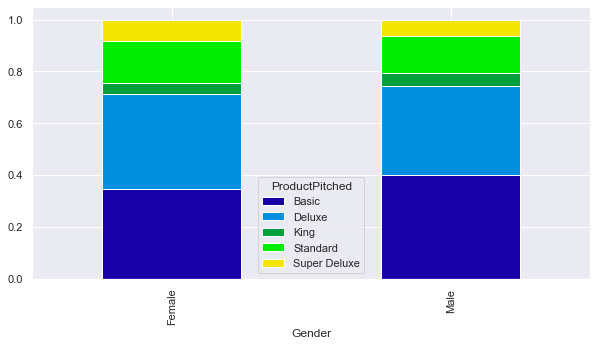

In [141]:
stacked_plot_Product(Tour['Gender'])

- Females are recommended more with Deluxe,Super Deluxe and Standard packages compared to males.

In [142]:
# Statistical significance of the relation between Gender and ProductPitched
crosstab = pd.crosstab(Tour['Gender'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "Gender has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "Gender has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Gender has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched     Basic  Deluxe  King  Standard  Super Deluxe   All
NumberOfFollowups                                                   
1.0                   72      65     4        17            18   176
2.0                   92      86     6        23            22   229
3.0                  556     509    75       221           105  1466
4.0                  767     724   100       333           144  2068
5.0                  288     263    36       133            48   768
6.0                   54      53     9        15             5   136
All                 1829    1700   230       742           342  4843
------------------------------------------------------------------------------------------------------------------------


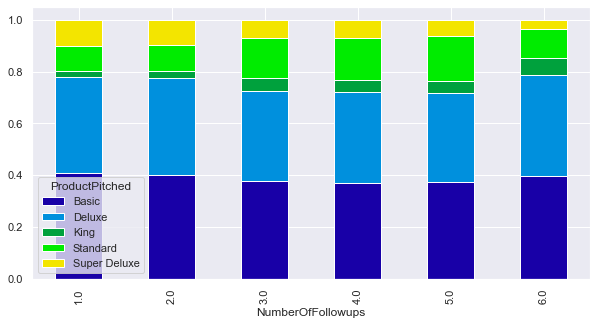

In [143]:
stacked_plot_Product(Tour['NumberOfFollowups'])

Not much significant difference is observed.

In [144]:
# Statistical significance of the relation between NumberOfFollowups and ProductPitched
crosstab = pd.crosstab(Tour['NumberOfFollowups'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "NumberOfFollowups has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "NumberOfFollowups has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

NumberOfFollowups has no effect on ProductPitched as the p_value (0.1) > 0.05


ProductPitched          Basic  Deluxe  King  Standard  Super Deluxe   All
PitchSatisfactionScore                                                   
1                         358     352    40       146            46   942
2                         204     220    34       102            26   586
3                         550     552    48       202           126  1478
4                         390     280    50       144            48   912
5                         340     328    58       148            96   970
All                      1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


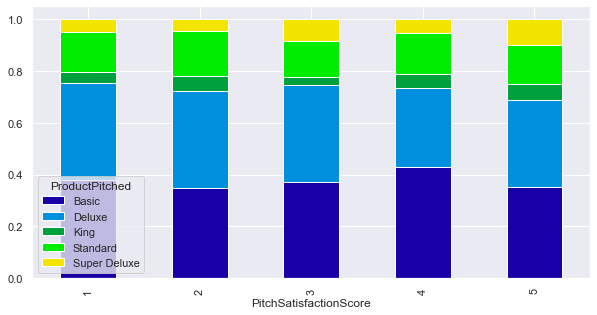

In [145]:
stacked_plot_Product(Tour['PitchSatisfactionScore'])

In [146]:
# Statistical significance of the relation between PitchSatisfactionScore and ProductPitched
crosstab = pd.crosstab(Tour['PitchSatisfactionScore'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "PitchSatisfactionScore has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "PitchSatisfactionScore has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

PitchSatisfactionScore has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
OwnCar                                                           
0                 758     674    64       258           102  1856
1                1084    1058   166       484           240  3032
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


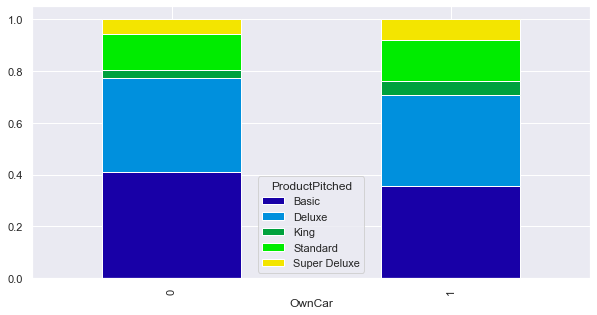

In [147]:
stacked_plot_Product(Tour['OwnCar'])

Standard,Super Deluxe and King packages are proposed more to customers who own a car.

In [148]:
# Statistical significance of the relation between OwnCar and ProductPitched
crosstab = pd.crosstab(Tour['OwnCar'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "OwnCar has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "OwnCar has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

OwnCar has an effect on ProductPitched as the p_value (0.0) < 0.05


ProductPitched         Basic  Deluxe  King  Standard  Super Deluxe   All
PreferredPropertyStar                                                   
3.0                     1118    1090   137       436           212  2993
4.0                      368     312    41       130            62   913
5.0                      355     329    29       175            68   956
All                     1841    1731   207       741           342  4862
------------------------------------------------------------------------------------------------------------------------


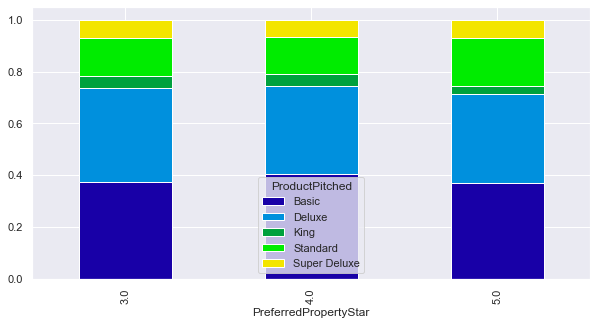

In [149]:
stacked_plot_Product(Tour['PreferredPropertyStar'])

PreferredPropertyStar has no effect on ProductPitched

In [150]:
# Statistical significance of the relation between PreferredPropertyStar and ProductPitched
crosstab = pd.crosstab(Tour['PreferredPropertyStar'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "PreferredPropertyStar has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "PreferredPropertyStar has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

PreferredPropertyStar has no effect on ProductPitched as the p_value (0.061) > 0.05


ProductPitched  Basic  Deluxe  King  Standard  Super Deluxe   All
Occupation                                                       
Free Lancer         2       0     0         0             0     2
Large Business    196     124    12        84            18   434
Salaried          924     818   114       338           174  2368
Small Business    720     790   104       320           150  2084
All              1842    1732   230       742           342  4888
------------------------------------------------------------------------------------------------------------------------


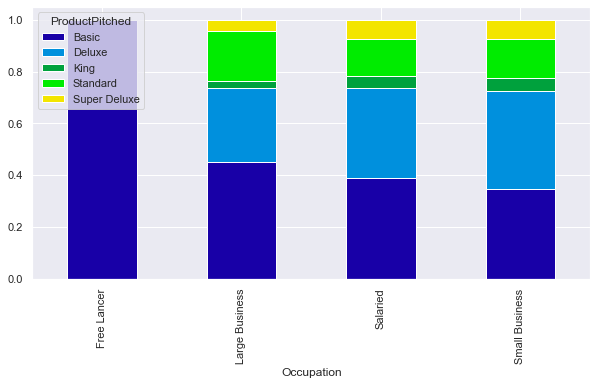

In [151]:
stacked_plot_Product(Tour['Occupation'])

Standard package is pitched more to Large Business compared to others.
Deluxe, Super Deluxe and King packages are pitched more to salaried and small Business.

In [152]:
# Statistical significance of the relation between Occupation and ProductPitched
crosstab = pd.crosstab(Tour['Occupation'],Tour['ProductPitched'])  # Contingency table of region and smoker attributes

Ho = "Occupation has no effect on ProductPitched"   # Stating the Null Hypothesis
Ha = "Occupation has an effect on ProductPitched"   # Stating the Alternate Hypothesis

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05')

Occupation has an effect on ProductPitched as the p_value (0.0) < 0.05


# Observations

- Customers prefer Basic and Deluxe packages over the others. 
- Executives prefer basic, managers prefer deluxe, senior managers prefer standard, AVPs and VPs prefer super deluxe and king packages respectively. 
- As the salaries tend to increase with the customer designations, we can arrange the cost of packages in the ascending order as Basic, Deluxe, Standard, Super Deluxe, and King.
- Unmarried people are more likely to make trips followed by married, divorced, and single. 
- Younger people tend to prefer basic packages. As the age increase, they tend to prefer higher cost packages.  Intuitively, as people age, they are more likely to progress in their career and make more money, which means they can afford more expensive packages. 
- Large business owners are more likely to purchase the travel package followed by 
- The above observations help us create customer profiles for the different packages offered by “Visit with us.” These will be discussed in the next section. 
- People with passport are more likely to travel compared to the people without passports.
- One third of the customers consider the pitchscore to be below average.  Also, people who are invited by the company are more likely to make the trips. Therefore, there is an opportunity to improve sales by training the business associates to be better at pitching the travel packages to potential customers. The training will not only increase the turnover but also help in reducing the follow-ups needed to make a sale. 


### Based on the data, we can deduce the typical customer profiles to be as follows.
* #### Basic Packages – 
Single, salaried executives (mostly from a Tier 1 City) under the age of 30.
* #### Deluxe Packages – 
Predominantly salaried managers and small business owners from ages 25 to 45 from tier 1 and tier 3 cities. Vast majority of customers are unmarried and female. 
* #### Standard Package – 
Senior Managers and large business owners over the age of 35. Majority of customers are unmarried. 
* #### Super Deluxe Package – 
Assistant VPs and business owners over the age of 40. 
* #### King Package – 
High Salaried Vice Presidents and owners over the age of 40. 


### Let us fix missing values

In [153]:
# looking at which columns have the most missing values
Tour.isnull().sum().sort_values(ascending=False) 

DurationOfPitch            251
MonthlyIncome              233
Age                        226
NumberOfTrips              140
NumberOfChildrenVisited     66
NumberOfFollowups           45
PreferredPropertyStar       26
TypeofContact               25
Gender                       0
CityTier                     0
Occupation                   0
ProductPitched               0
NumberOfPersonVisited        0
Designation                  0
MaritalStatus                0
Passport                     0
PitchSatisfactionScore       0
OwnCar                       0
ProdTaken                    0
dtype: int64

In [154]:
# Impute missing DurationOfPitch,NumberOfTrips,NumberOfChildrenVisited,NumberOfFollowups
Tour["Age"] = Tour["Age"].transform(
    lambda x: x.fillna(x.median())
)
Tour["DurationOfPitch"] = Tour["DurationOfPitch"].transform(
    lambda x: x.fillna(x.median())
)
Tour["NumberOfTrips"] = Tour["NumberOfTrips"].transform(
    lambda x: x.fillna(x.median())
)
Tour["NumberOfChildrenVisited"] = Tour["NumberOfChildrenVisited"].transform(
    lambda x: x.fillna(x.median())
)
Tour["NumberOfFollowups"] = Tour["NumberOfFollowups"].transform(
    lambda x: x.fillna(x.median())
)
Tour["PreferredPropertyStar"] = Tour["PreferredPropertyStar"].transform(
    lambda x: x.fillna(x.median())
)
Tour["TypeofContact"] = Tour['TypeofContact'].fillna(Tour.TypeofContact.mode()[0])

In [155]:
Tour.isnull().sum().sort_values(ascending=False) 

MonthlyIncome              233
NumberOfFollowups            0
Age                          0
TypeofContact                0
CityTier                     0
DurationOfPitch              0
Occupation                   0
Gender                       0
NumberOfPersonVisited        0
ProductPitched               0
Designation                  0
PreferredPropertyStar        0
MaritalStatus                0
NumberOfTrips                0
Passport                     0
PitchSatisfactionScore       0
OwnCar                       0
NumberOfChildrenVisited      0
ProdTaken                    0
dtype: int64

### Create Dummy variables

In [156]:
Tour=pd.get_dummies(Tour, columns=["TypeofContact", "Occupation","Gender","ProductPitched","MaritalStatus","Designation"],prefix=["TypeofContact", "Occupation","Gender","ProductPitched","MaritalStatus","Designation"], drop_first=True)


In [157]:
Tour_cat=Tour['ProdTaken']

In [158]:
# Dropping the columns which are not required while imputation.
Tour.drop(['ProdTaken'], axis=1,inplace=True)

In [159]:
from fancyimpute import KNN
# calling the KNN class
knn_imputer = KNN()
# imputing the missing value with knn imputer
imputed_data = knn_imputer.fit_transform(Tour)
Tour = pd.DataFrame(imputed_data,columns=Tour.columns)

Imputing row 1/4888 with 0 missing, elapsed time: 3.841
Imputing row 101/4888 with 0 missing, elapsed time: 3.843
Imputing row 201/4888 with 1 missing, elapsed time: 3.844
Imputing row 301/4888 with 0 missing, elapsed time: 3.845
Imputing row 401/4888 with 0 missing, elapsed time: 3.846
Imputing row 501/4888 with 0 missing, elapsed time: 3.847
Imputing row 601/4888 with 0 missing, elapsed time: 3.847
Imputing row 701/4888 with 0 missing, elapsed time: 3.848
Imputing row 801/4888 with 0 missing, elapsed time: 3.849
Imputing row 901/4888 with 0 missing, elapsed time: 3.849
Imputing row 1001/4888 with 0 missing, elapsed time: 3.850
Imputing row 1101/4888 with 0 missing, elapsed time: 3.851
Imputing row 1201/4888 with 0 missing, elapsed time: 3.851
Imputing row 1301/4888 with 0 missing, elapsed time: 3.852
Imputing row 1401/4888 with 0 missing, elapsed time: 3.852
Imputing row 1501/4888 with 0 missing, elapsed time: 3.853
Imputing row 1601/4888 with 0 missing, elapsed time: 3.854
Imputing 

In [160]:
# Concatenate the two dataframes(missing value imputed variables with other target variable that we separated before imputation)
Tour=pd.concat([Tour,Tour_cat],axis=1)

In [161]:
Tour.columns

Index(['Age', 'CityTier', 'DurationOfPitch', 'NumberOfPersonVisited',
       'NumberOfFollowups', 'PreferredPropertyStar', 'NumberOfTrips',
       'Passport', 'PitchSatisfactionScore', 'OwnCar',
       'NumberOfChildrenVisited', 'MonthlyIncome',
       'TypeofContact_Self Enquiry', 'Occupation_Large Business',
       'Occupation_Salaried', 'Occupation_Small Business', 'Gender_Male',
       'ProductPitched_Deluxe', 'ProductPitched_King',
       'ProductPitched_Standard', 'ProductPitched_Super Deluxe',
       'MaritalStatus_Married', 'MaritalStatus_Single',
       'MaritalStatus_Unmarried', 'Designation_Executive',
       'Designation_Manager', 'Designation_Senior Manager', 'Designation_VP',
       'ProdTaken'],
      dtype='object')

In [162]:
Tour.head()

,Age,CityTier,DurationOfPitch,NumberOfPersonVisited,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisited,MonthlyIncome,TypeofContact_Self Enquiry,Occupation_Large Business,Occupation_Salaried,Occupation_Small Business,Gender_Male,ProductPitched_Deluxe,ProductPitched_King,ProductPitched_Standard,ProductPitched_Super Deluxe,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,Designation_Executive,Designation_Manager,Designation_Senior Manager,Designation_VP,ProdTaken
0,41.0,3.0,6.0,3.0,3.0,3.0,1.0,1.0,2.0,1.0,0.0,20993.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1
1,49.0,1.0,14.0,3.0,4.0,4.0,2.0,0.0,3.0,1.0,2.0,20130.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
2,37.0,1.0,8.0,3.0,4.0,3.0,7.0,1.0,3.0,0.0,0.0,17090.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1
3,33.0,1.0,9.0,2.0,3.0,3.0,2.0,1.0,5.0,1.0,1.0,17909.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
4,36.0,1.0,8.0,2.0,3.0,4.0,1.0,0.0,5.0,1.0,0.0,18468.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0


In [163]:
# looking at which columns have the most missing values
Tour.isnull().sum().sort_values(ascending=False) 

ProdTaken                      0
Occupation_Large Business      0
CityTier                       0
DurationOfPitch                0
NumberOfPersonVisited          0
NumberOfFollowups              0
PreferredPropertyStar          0
NumberOfTrips                  0
Passport                       0
PitchSatisfactionScore         0
OwnCar                         0
NumberOfChildrenVisited        0
MonthlyIncome                  0
TypeofContact_Self Enquiry     0
Occupation_Salaried            0
Designation_VP                 0
Occupation_Small Business      0
Gender_Male                    0
ProductPitched_Deluxe          0
ProductPitched_King            0
ProductPitched_Standard        0
ProductPitched_Super Deluxe    0
MaritalStatus_Married          0
MaritalStatus_Single           0
MaritalStatus_Unmarried        0
Designation_Executive          0
Designation_Manager            0
Designation_Senior Manager     0
Age                            0
dtype: int64

## Lets look at outliers in every numerical column

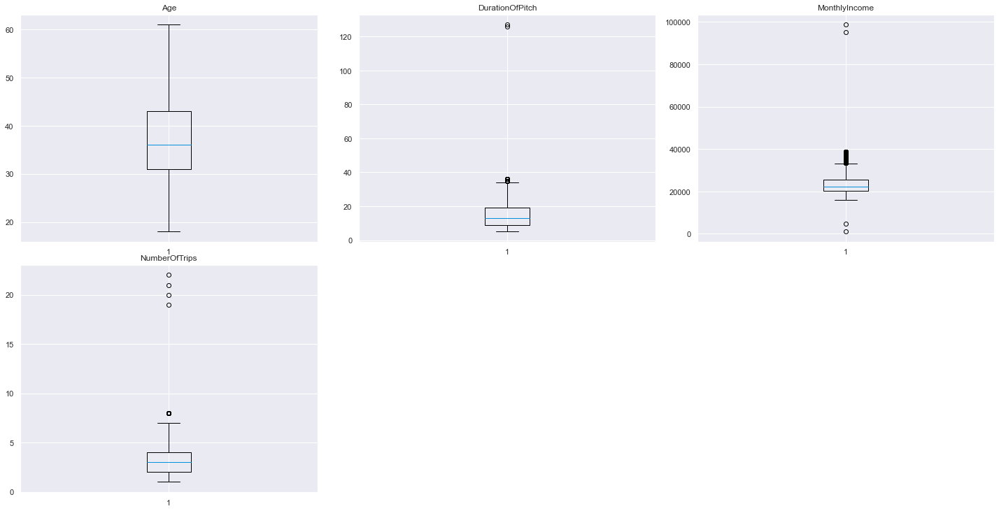

In [164]:
numeric_columns=['Age','DurationOfPitch','MonthlyIncome','NumberOfTrips']
# lets look at box plot to see if outliers has been treated or not
plt.figure(figsize=(20,20))

for i, variable in enumerate(numeric_columns):
                     plt.subplot(4,3,i+1)
                     plt.boxplot(Tour[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

In [165]:
# Lets treat outliers by flooring and capping them at 3.5IQR
def treat_outliers(df,col):
    '''
    treats outliers in a varaible
    col: str, name of the numerical varaible
    df: data frame
    col: name of the column
    '''
    Q1=df[col].quantile(0.25) # 25th quantile
    Q3=df[col].quantile(0.75)  # 75th quantile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 3.5*IQR 
    Upper_Whisker = Q3 + 3.5*IQR
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker) # all the values samller than Lower_Whisker will be assigned value of Lower_whisker 
                                                            # and all the values above upper_whishker will be assigned value of upper_Whisker 
    return df

def treat_outliers_all(df, col_list):
    '''
    treat outlier in all numerical varaibles
    col_list: list of numerical varaibles
    df: data frame
    '''
    for c in col_list:
        df = treat_outliers(df,c)
        
    return df
    

## Treating Outliers

In [166]:
Tour = treat_outliers_all(Tour,numeric_columns)

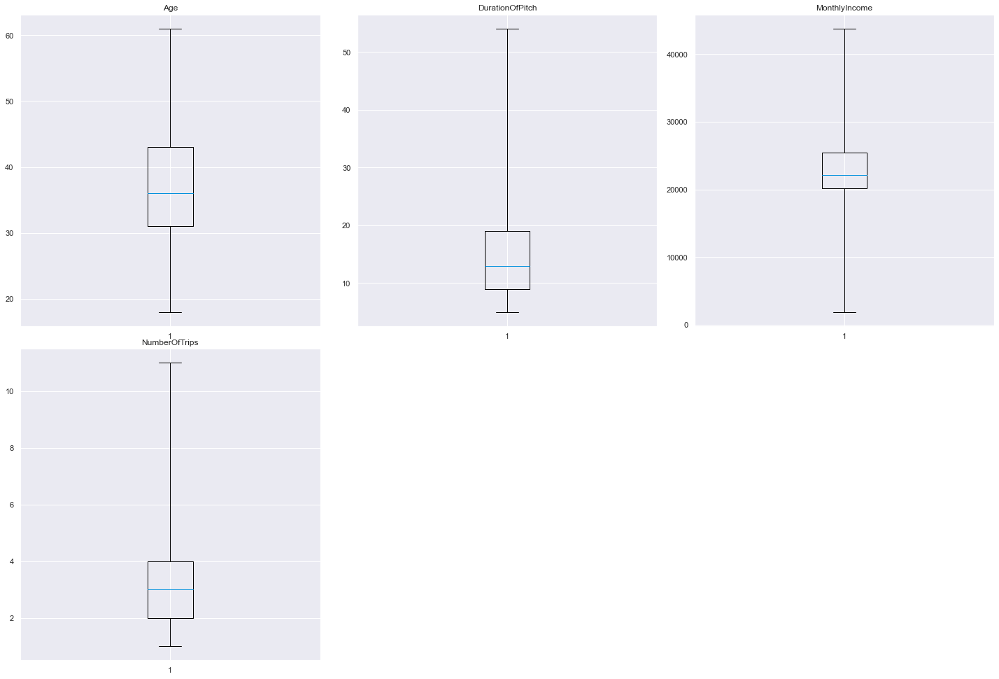

In [167]:
# lets look at box plot to see if outliers has been treated or not
plt.figure(figsize=(20,20))

for i, variable in enumerate(numeric_columns):
                     plt.subplot(3,3,i+1)
                     plt.boxplot(Tour[variable],whis=3.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

## Model Building

**What does a travel company want?**

* The "Visit with us" travel company wants to identify the potential customers who have higher probability of purchasing the newly introduced travel package. 
  Here the travel company can face 2 types of problems here: 
   * Travel company cannot identify potential customers and lose business/opportunity.
   * A travel company wrongly predicts customers,who doesnt want to buy travel package, as potential customers and spends money on them for the marketing.Increase on marketing costs.

    
### Insights:

- **True Positives:**
    - Reality: A customer bought the travel package offered by the travel company.
    - Model predicted: The customer will buy the travel package.
    - Outcome: The model is good.

- **True Negatives:**
    - Reality: A customer did NOT buy the travel package offered by the travel company.
    - Model predicted: The customer will NOT buy the travel package offered by the travel company.
    - Outcome: The business is unaffected.

- **False Positives:**
    - Reality: A customer did NOT buy the travel package offered by the travel company.
    - Model predicted: The customer will buy the travel package offered by the travel company.
    - Outcome: The retail marketing department which is targeting the potential customers will be wasting their resources and costs on the people/customers who will not be contributing to the revenue.

- **False Negatives:**
    - Reality: A customer bought the travel package offered by the travel company.
    - Model predicted: The customer will NOT buy the travel package offered by the travel company.
    - Outcome: The potential customer is missed by the marketing department, the team could have designed some campaigns for potential customer or made some exclusive offers to make the customer come again to purchase. (Customer retention will get affected.)    
    
    
**Which loss is greater ?**    
This can be answered in two parts. 
- For the scope of this project, the objective is to reduce the marketing costs by targeting the potential customers. Incurring expenditure on customers who are not likely to purchase a package will make the process inefficient and increase marketing costs. So, we need to reduce False positives. Hence, precision is the right metric to check the performance of the model. 
- At the same time, as a data analyst who is presenting this to the C-suite, a case can be made to go beyond the scope and reduce false negatives so that the business does not lose potential customers and increases its revenue. For this reason, F1-score metric also has been considered!

### Split the data into train and test sets
- When data (classification) exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets.
- This is done by setting the stratify parameter to target variable in the train_test_split function.

In [168]:
X = Tour.drop("ProdTaken", axis=1)
y = Tour.pop("ProdTaken")

In [169]:
#Convert categorical variables to dummy variables
X = pd.get_dummies(X, drop_first=True)
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y, test_size=0.30,stratify=y,random_state=42)

Before building the model, let's create functions to calculate different metrics- Accuracy, Recall and Precision and plot the confusion matrix.

In [170]:
## Function to create confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [171]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    #Predicting on train and tests
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    #Accuracy of the model
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    #Recall of the model
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    #Precision of the model
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    #f1-Score of the model
    train_f1_score = metrics.f1_score(y_train,pred_train)
    test_f1_score = metrics.f1_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision,train_f1_score,test_f1_score))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
        print("F1 Score on training set : ",metrics.f1_score(y_train,pred_train))
        print("F1 Score on test set : ",metrics.f1_score(y_test,pred_test))
        
    return score_list # returning the list with train and test scores


### Build Decision Tree Model

In [172]:
DTModel = DecisionTreeClassifier(criterion='gini',class_weight={0:0.18,1:0.82},random_state=1)
DTModel.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, random_state=1)

In [173]:
#Using above defined function to get accuracy, recall and precision on train and test set
Decision_Tree_Score=get_metrics_score(DTModel)

Accuracy on training set :  1.0
Accuracy on test set :  0.885480572597137
Recall on training set :  1.0
Recall on test set :  0.6340579710144928
Precision on training set :  1.0
Precision on test set :  0.7231404958677686
F1 Score on training set :  1.0
F1 Score on test set :  0.6756756756756757


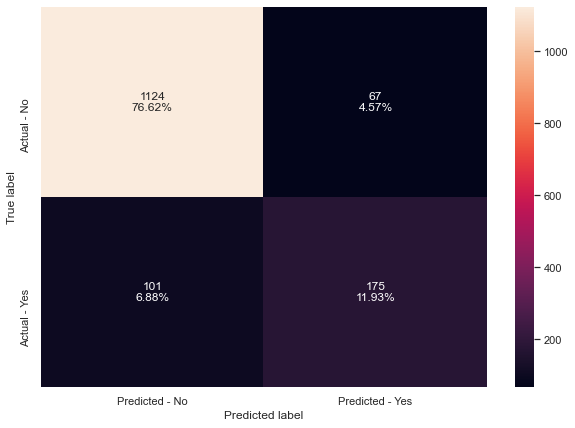

In [174]:
make_confusion_matrix(DTModel,y_test)

The Decisiontree is overfitting on training data. Lets perform hypertuning to reduce overfitting.

In [175]:
# Choose the type of classifier. 
dtree_tuned = DecisionTreeClassifier(random_state=1,class_weight = {0:.18,1:.82})

# Grid of parameters to choose from
parameters = {
            'max_depth': np.arange(10,15),
           'criterion': ['entropy','gini'],
            'splitter': ['best','random'],
            #'min_impurity_decrease': [0.000001,0.00001,0.0001],
           # 'max_features': ['log2','sqrt']
    'max_features': ['sqrt'],
    'min_samples_leaf': [1, 2, 5, 7, 10,15,20],
    'min_samples_split':[70,80,90,100],
    #'max_leaf_nodes' : [5, 10,15,20,25,30],
    #'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
             
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_tuned.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=12,
                       max_features='sqrt', min_samples_leaf=10,
                       min_samples_split=80, random_state=1)

In [176]:
#Using above defined function to get accuracy, recall and precision on train and test set
Decision_Tree_Tuned_Score=get_metrics_score(dtree_tuned)

Accuracy on training set :  0.7570885705933937
Accuracy on test set :  0.7191547375596455
Recall on training set :  0.8090062111801242
Recall on test set :  0.6847826086956522
Precision on training set :  0.4239218877135883
Precision on test set :  0.36770428015564205
F1 Score on training set :  0.5563267485317672
F1 Score on test set :  0.4784810126582279


The model is not overfitting anymore but the Accuracy is very low.Recall has improved but the precision has decreased. 

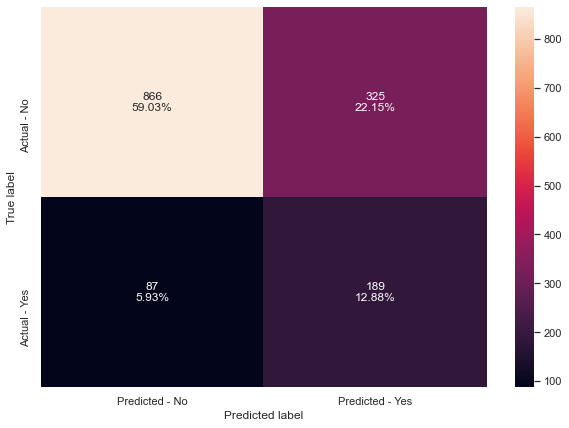

In [177]:
make_confusion_matrix(dtree_tuned,y_test)

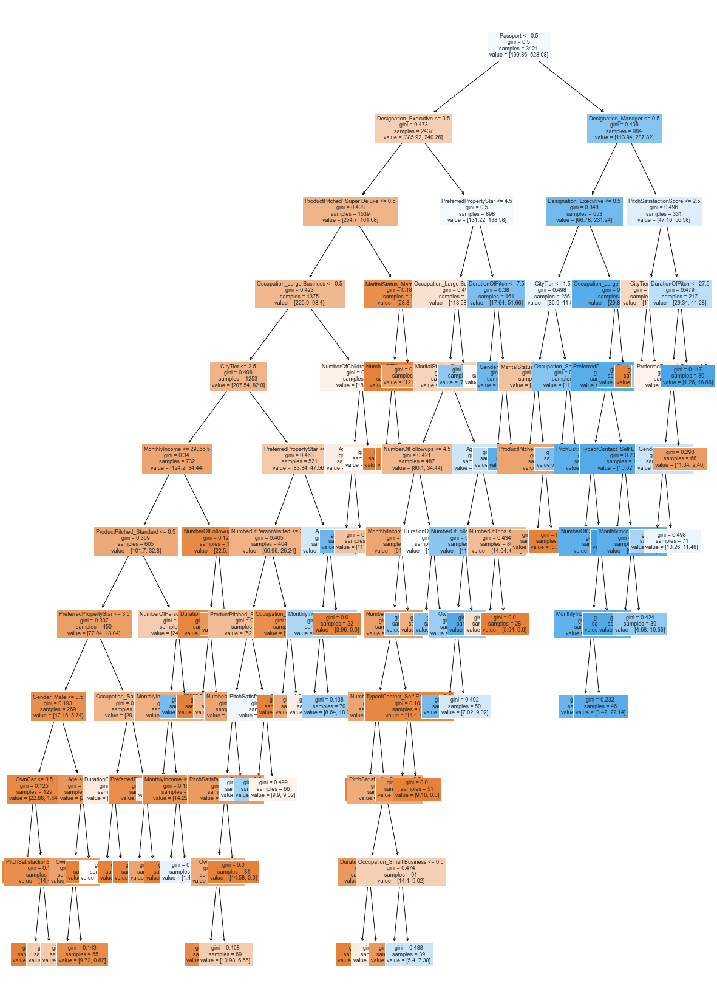

In [178]:
column_names = list(X.columns)
feature_names = column_names
plt.figure(figsize=(20,30))
out = tree.plot_tree(dtree_tuned,feature_names=feature_names,filled=True,fontsize=9,node_ids=False,class_names=None,)
#below code will add arrows to the decision tree split if they are missing
for o in out:
     arrow = o.arrow_patch
     if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(1)
plt.show()

In [179]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dtree_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                  Imp
Passport                     0.256258
Designation_Executive        0.136301
PreferredPropertyStar        0.093465
DurationOfPitch              0.074378
CityTier                     0.070469
Age                          0.043917
MonthlyIncome                0.041987
Designation_Manager          0.038681
Occupation_Large Business    0.030324
MaritalStatus_Single         0.027529
PitchSatisfactionScore       0.025922
ProductPitched_Standard      0.023181
NumberOfPersonVisited        0.022349
NumberOfTrips                0.022067
NumberOfFollowups            0.019855
Occupation_Salaried          0.015335
OwnCar                       0.013689
ProductPitched_Super Deluxe  0.012819
Occupation_Small Business    0.009842
MaritalStatus_Married        0.009112
Gender_Male                  0.008727
TypeofContact_Self Enquiry   0.003344
NumberOfChildrenVisited      0.000448
ProductPitched_Deluxe        0.000000
ProductPitched_King          0.000000
MaritalStatu

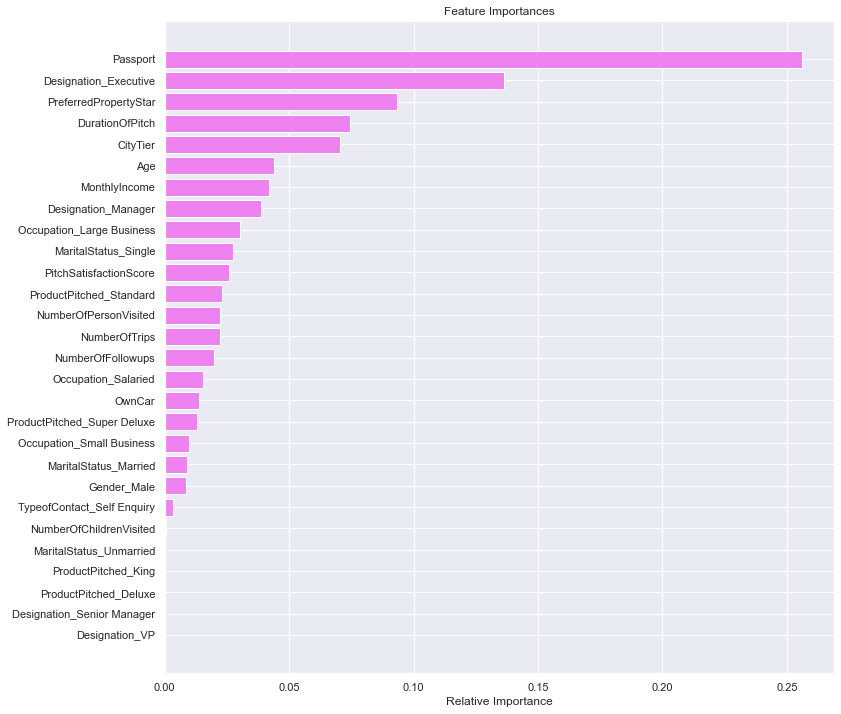

In [180]:
feature_names = X_train.columns
importances = dtree_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Passport,Designation_Executive and CityTier,Preferred PropertyStar are the top features.

### Building various ensemble models
- We are going to build various ensemble models here - Bagging Classifier,Random Forest Classifier,Adaboost, Gradient Boost and XGBoost.
- First, let's build these models with default parameters and then use hyperparameter tuning to optimize the model performance.
- We will calculate all three metrics - Accuracy, Precision and Recall but the metric of interest here is recall.
- Recall - It gives the ratio of True positives to Actual positives, so high Recall implies low false negatives, i.e. low chances of predicting a potential customer as non potential customer.

## Bagging Classifier

In [181]:
#base_estimator for bagging classifier is a decision tree by default
bagging_estimator=BaggingClassifier(random_state=1)
bagging_estimator.fit(X_train,y_train)

BaggingClassifier(random_state=1)

In [182]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_estimator_score=get_metrics_score(bagging_estimator)

Accuracy on training set :  0.9932768196433791
Accuracy on test set :  0.9188820722563054
Recall on training set :  0.9658385093167702
Recall on test set :  0.677536231884058
Precision on training set :  0.9983948635634029
Precision on test set :  0.8617511520737328
F1 Score on training set :  0.9818468823993686
F1 Score on test set :  0.7586206896551725


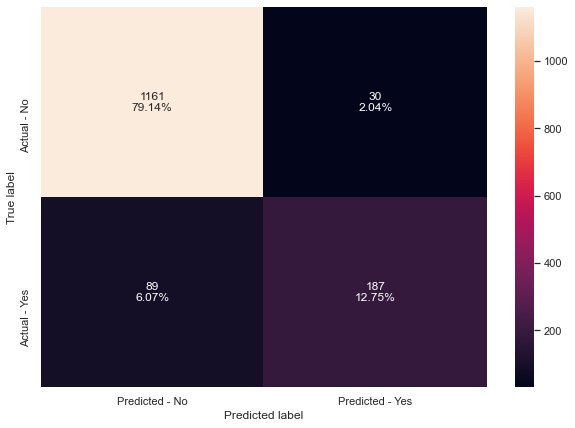

In [183]:
make_confusion_matrix(bagging_estimator,y_test)

We see that BaggingClassifier is overfitting the training data

### Random Forest Classifier

In [184]:
#Train the random forest classifier
rf_estimator=RandomForestClassifier(random_state=1)
rf_estimator.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

In [185]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_estimator_score=get_metrics_score(rf_estimator)

Accuracy on training set :  1.0
Accuracy on test set :  0.9011588275391956
Recall on training set :  1.0
Recall on test set :  0.5507246376811594
Precision on training set :  1.0
Precision on test set :  0.8786127167630058
F1 Score on training set :  1.0
F1 Score on test set :  0.6770601336302895


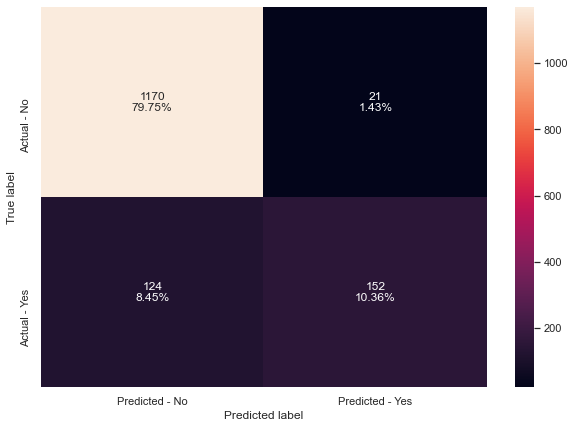

In [186]:
make_confusion_matrix(rf_estimator,y_test)

### With default parameters:

Both models - Bagging classifiers as well as random forest classifier are overfitting the train data.
Both models are giving similar performance in terms of accuracy but bagging classifier is giving better recall and better precision.

## Hyperparameter Tuning
### Bagging Classifier
Some of the important hyperparameters available for bagging classifier are:

* base_estimator: The base estimator to fit on random subsets of the dataset. If None(default), then the base estimator is a decision tree.
* n_estimators: The number of trees in the forest, default = 10.
* max_features: The number of features to consider when looking for the best split.
* bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
* bootstrap_features: If it is true, then features are drawn with replacement. Default value is False.
* max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
* oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

In [187]:
# Choose the type of classifier. 
bagging_estimator_tuned = BaggingClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.7,0.8,0.9,1],
              'n_estimators' : [10,20,30,40,50],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(bagging_estimator_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
bagging_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
bagging_estimator_tuned.fit(X_train, y_train)

BaggingClassifier(max_features=0.9, max_samples=0.9, n_estimators=40,
                  random_state=1)

Let's check different metrics for bagging classifier with best hyperparameters and build a confusion matrix.

In [188]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_estimator_tuned_score=get_metrics_score(bagging_estimator_tuned)


Accuracy on training set :  0.9985384390529085
Accuracy on test set :  0.9100204498977505
Recall on training set :  0.9922360248447205
Recall on test set :  0.6086956521739131
Precision on training set :  1.0
Precision on test set :  0.875
F1 Score on training set :  0.9961028838659391
F1 Score on test set :  0.717948717948718


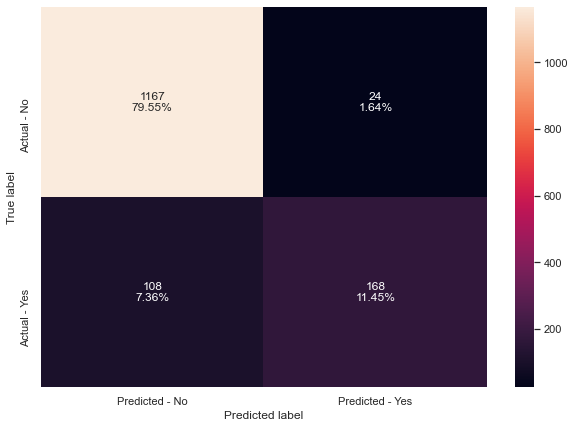

In [189]:
make_confusion_matrix(bagging_estimator_tuned,y_test)

bagging_estimator_tuned_feature_importances = np.mean([
    tree.feature_importances_ for tree in bagging_estimator_tuned.estimators_], axis=0)
bagging_estimator_tuned_feature_importances

### Insights
We can see that train accuracy ,precision and recall for the bagging classifier have increased slightly after hyperparameter tuning but the test recall has decreased.
The model is overfitting the data, as train accuracy, precision and recall are much higher than the test accuracy,test precision and test recall.
Our metric Precision is overfitting the train data and thereby this model cannot be considered.
The confusion matrix shows that the model is better at identifying non-potential customers as compared to potential customers.

Let's try using logistic regression as the base estimator for bagging classifier:
Now, let's try and change the base_estimator of the bagging classifier, which is a decision tree by default.
We will pass the logistic regression as the base estimator for bagging classifier.

In [190]:
bagging_lr=BaggingClassifier(base_estimator=LogisticRegression(random_state=1,max_iter=1000),random_state=1)
bagging_lr.fit(X_train,y_train)

BaggingClassifier(base_estimator=LogisticRegression(max_iter=1000,
                                                    random_state=1),
                  random_state=1)

In [191]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_lr_score=get_metrics_score(bagging_lr)

Accuracy on training set :  0.8468284127448115
Accuracy on test set :  0.8289025221540559
Recall on training set :  0.29347826086956524
Recall on test set :  0.2572463768115942
Precision on training set :  0.7325581395348837
Precision on test set :  0.6068376068376068
F1 Score on training set :  0.4190687361419069
F1 Score on test set :  0.361323155216285


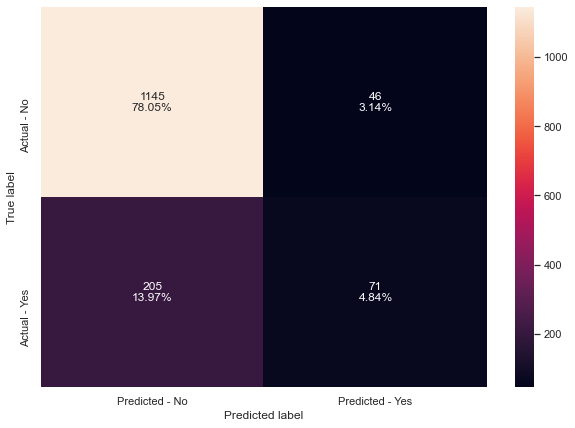

In [192]:
make_confusion_matrix(bagging_lr,y_test)

### Insights
- Bagging classifier with logistic regression as base_estimator is not overfitting the data and the test precision seems to be better.But there is lot of difference in traina nd test precision indicating that the model is overfitting and also the f1-scores are very low.
- Ensemble models are less interpretable than decision tree but bagging classifier is even less interpretable than random forest. It does not even have a feature importance attribute.

### Random Forest Classifier - HyperTuning
Now, let's see if we can get a better model by tuning the random forest classifier. Some of the important hyperparameters available for random forest classifier are:

* n_estimators: The number of trees in the forest, default = 100.
* max_features: The number of features to consider when looking for the best split.
* class_weight: Weights associated with classes in the form {class_label: weight}.If not given, all classes are supposed to have weight one.
* For example: If the frequency of class 0 is 80% and the frequency of class 1 is 20% in the data, then class 0 will become the dominant class and the model will become biased toward the dominant classes. In this case, we can pass a dictionary {0:0.2,1:0.8} to the model to specify the weight of each class and the random forest will give more weightage to class 1.
* bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
* max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
* oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

* Note: A lot of hyperparameters of Decision Trees are also available to tune Random Forest like max_depth, min_sample_split etc.

In [193]:
# Choose the type of classifier. 
rf_estimator_tuned = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {"n_estimators": [150,200,250],
    "min_samples_leaf": [5,6,7,8,9],
    "max_features": [0.2,0.3,0.4,0.5,0.6],
    "max_samples": [0.3,0.4,0.5,0.6]
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(rf_estimator_tuned, parameters, scoring=acc_scorer,cv=)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_estimator_tuned.fit(X_train, y_train)

RandomForestClassifier(max_features=0.6, max_samples=0.6, min_samples_leaf=5,
                       n_estimators=250, random_state=1)

In [194]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_estimator_tuned_score=get_metrics_score(rf_estimator_tuned)

Accuracy on training set :  0.9187372113417129
Accuracy on test set :  0.8629856850715747
Recall on training set :  0.6009316770186336
Recall on test set :  0.40217391304347827
Precision on training set :  0.9485294117647058
Precision on test set :  0.7551020408163265
F1 Score on training set :  0.7357414448669202
F1 Score on test set :  0.524822695035461


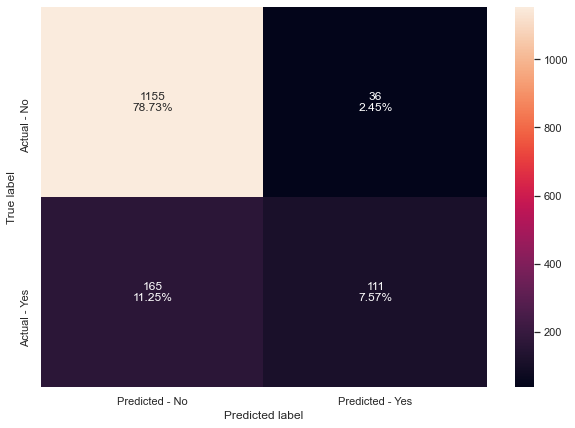

In [195]:

make_confusion_matrix(rf_estimator_tuned,y_test)

### Insights:
We can see that random forest's performance has increased as compared to the random forest model with default parameters.
Model is slightly overfitting the data but not as much as the tuned bagging classifier.
The test recall is still very low. This means that the model is not good at identifying potential customers.
There is huge difference between train and test precision indicating the model is overfitting. 

Let's try using class_weights for random forest:
The model performance is not very good. This may be due to the fact that the classes are imbalanced with 82% non-potential customers and 18% potential customers.

We should make the model aware that the class of interest here is 'potential customers'.

We can do so by passing the parameter class_weights available for random forest. This parameter is not available for the bagging classifier.

class_weight specifies the weights associated with classes in the form {class_label: weight}. If not given, all classes are supposed to have weight one.

We can choose class_weights={0:0.18,1:0.82} because that is the original imbalance in our data.

In [196]:
# Choose the type of classifier. 
rf_estimator_weighted = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "class_weight": [{0: 0.18, 1: 0.82}],
    "n_estimators": [100,150,200,250],
    "min_samples_leaf": [5,6,7,8,9],
    "max_features": [0.2,0.3,0.4,0.5,0.6,0.7,0.8],
    "max_samples": [0.3,0.4,0.5,0.6],
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(rf_estimator_weighted, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_estimator_weighted = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_estimator_weighted.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 0.18, 1: 0.82}, max_features=0.4,
                       max_samples=0.6, min_samples_leaf=9, random_state=1)

In [197]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_estimator_weighted_score=get_metrics_score(rf_estimator_weighted)

Accuracy on training set :  0.8897983045893014
Accuracy on test set :  0.8241308793456033
Recall on training set :  0.8369565217391305
Recall on test set :  0.605072463768116
Precision on training set :  0.6646115906288532
Precision on test set :  0.5284810126582279
F1 Score on training set :  0.740893470790378
F1 Score on test set :  0.5641891891891893


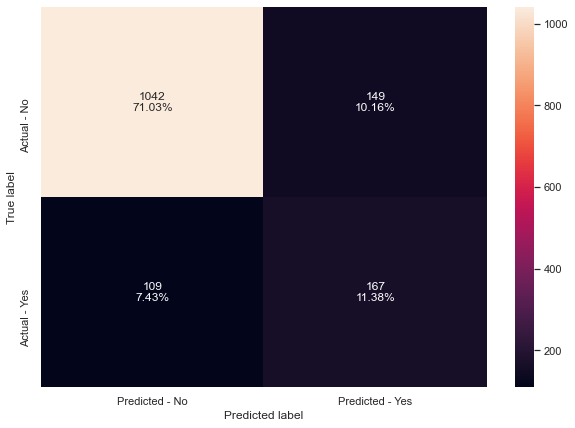

In [198]:
make_confusion_matrix(rf_estimator_weighted,y_test)

### Insights
The model accuracy has decreased a bit but the overfitting has also been reduced and the model is generalizing well.
The train and test recall both have increased significantly.The Precision has decreased but the f1-score has improved slightly.
We can see from the confusion matrix that the random forest model with class weights is now better at identifying the potential customers as compared to other models.

In [199]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(rf_estimator_weighted.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                  Imp
Passport                     0.160249
Age                          0.110462
DurationOfPitch              0.097228
Designation_Executive        0.092186
MonthlyIncome                0.089233
CityTier                     0.056613
PreferredPropertyStar        0.056591
NumberOfTrips                0.043482
PitchSatisfactionScore       0.043194
NumberOfFollowups            0.038833
MaritalStatus_Single         0.031259
MaritalStatus_Married        0.023780
Gender_Male                  0.018654
ProductPitched_Deluxe        0.013379
Designation_Manager          0.012751
Occupation_Salaried          0.012736
Occupation_Large Business    0.012363
TypeofContact_Self Enquiry   0.011614
MaritalStatus_Unmarried      0.011467
NumberOfPersonVisited        0.011426
OwnCar                       0.011101
Occupation_Small Business    0.011072
NumberOfChildrenVisited      0.010680
Designation_Senior Manager   0.007695
ProductPitched_Standard      0.006364
ProductPitch

### Checking the feature importance¶

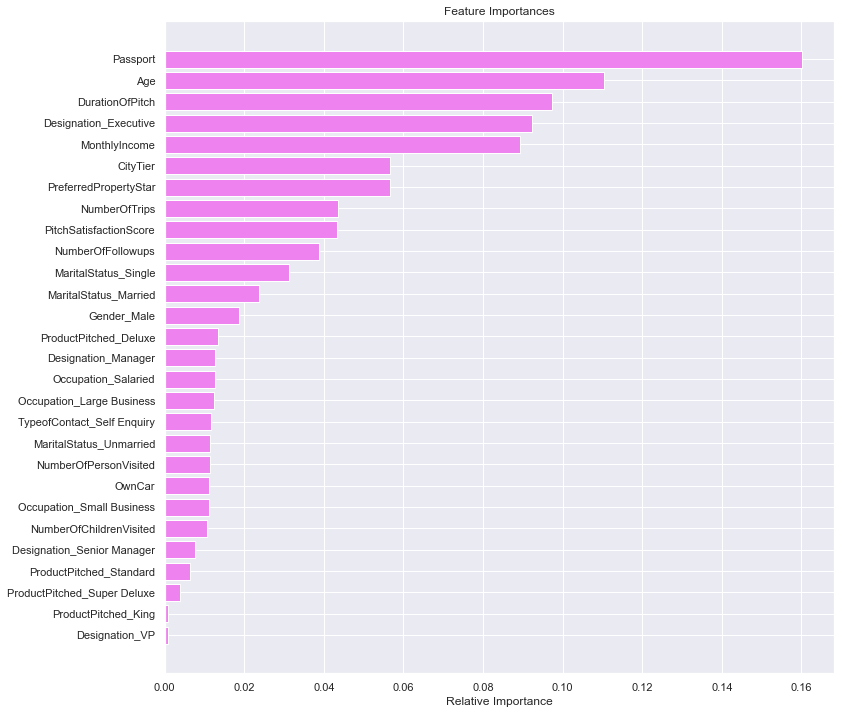

In [200]:
importances = rf_estimator_weighted.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Passport, Age and Duration of Pitch are the top 3 features.

### Comparing all models till now

In [201]:
# defining list of models
models = [DTModel,dtree_tuned,bagging_estimator,bagging_estimator_tuned,bagging_lr,rf_estimator,rf_estimator_tuned,
          rf_estimator_weighted]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_score_train=[]
f1_score_test=[]


# looping through all the models to get the accuracy, precall and precision and f1- scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_test.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_test.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_test.append(np.round(j[5],2))
    f1_score_train.append(np.round(j[6],2))
    f1_score_test.append(np.round(j[7],2))
    

In [202]:
comparison_frame = pd.DataFrame({'Model':['Decision Tree Model','Tuned Decision Tree','Bagging classifier with default parameters','Tuned Bagging Classifier',
                                        'Bagging classifier with base_estimator=LR', 'Random Forest with deafult parameters',
                                         'Tuned Random Forest Classifier','Random Forest with class_weights'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_f1_score':f1_score_train,'Test_f1_score':f1_score_test}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_f1_score,Test_f1_score
0,Decision Tree Model,1.00,0.89,1.00,0.63,1.00,0.72,1.00,0.68
1,Tuned Decision Tree,0.76,0.72,0.81,0.68,0.42,0.37,0.56,0.48
2,Bagging classifier with default parameters,0.99,0.92,0.97,0.68,1.00,0.86,0.98,0.76
3,Tuned Bagging Classifier,1.00,0.91,0.99,0.61,1.00,0.88,1.00,0.72
4,Bagging classifier with base_estimator=LR,0.85,0.83,0.29,0.26,0.73,0.61,0.42,0.36
5,Random Forest with deafult parameters,1.00,0.90,1.00,0.55,1.00,0.88,1.00,0.68
6,Tuned Random Forest Classifier,0.92,0.86,0.60,0.40,0.95,0.76,0.74,0.52
7,Random Forest with class_weights,0.89,0.82,0.84,0.61,0.66,0.53,0.74,0.56


### Building Boosting Methods
- We are going to build 3 boosting models here - AdaBoost Classifier, Gradient Boosting Classifier and XGBoost Classifier.
- First, let's build these models with default parameters and then use hyperparameter tuning to optimize the model performance.
- We will calculate all three metrics - Accuracy, Precision and Recall but the metric of interest here is recall.
- Recall - It gives the ratio of True positives to Actual positives, so high Recall implies low false negatives, i.e. low chances of predicting a potential customer as non potential customer.


## AdaBoost Classifier

In [203]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y, test_size=0.30,stratify=y,random_state=42)

In [204]:
abc = AdaBoostClassifier(random_state=1)
abc.fit(X_train,y_train)

AdaBoostClassifier(random_state=1)

In [205]:
#Using above defined function to get accuracy, recall and precision on train and test set
abc_score=get_metrics_score(abc)

Accuracy on training set :  0.8570593393744519
Accuracy on test set :  0.8302658486707567
Recall on training set :  0.3804347826086957
Recall on test set :  0.29347826086956524
Precision on training set :  0.7313432835820896
Precision on test set :  0.6
F1 Score on training set :  0.5005107252298263
F1 Score on test set :  0.39416058394160586


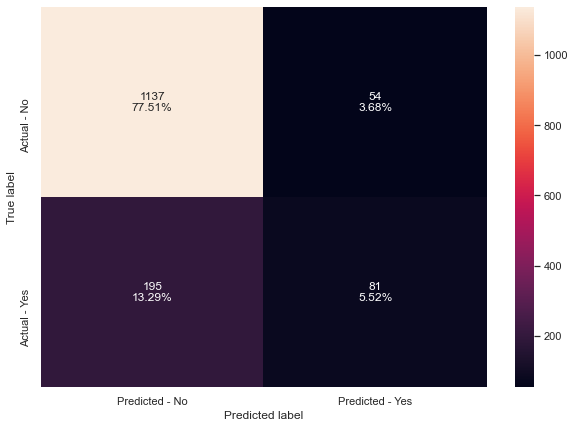

In [206]:
make_confusion_matrix(abc,y_test)

## Gradient Boosting Classifier

In [207]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

In [208]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_score=get_metrics_score(gbc)

Accuracy on training set :  0.8897983045893014
Accuracy on test set :  0.8520790729379687
Recall on training set :  0.4968944099378882
Recall on test set :  0.358695652173913
Precision on training set :  0.8579088471849866
Precision on test set :  0.7122302158273381
F1 Score on training set :  0.6293018682399214
F1 Score on test set :  0.47710843373493966


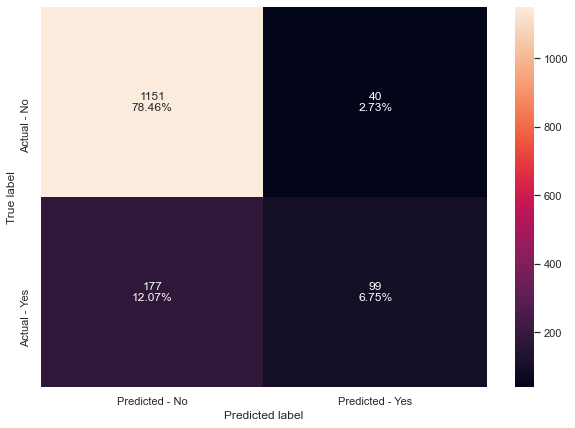

In [209]:
make_confusion_matrix(gbc,y_test)

## XGBoost Classifier

In [210]:
xgb = XGBClassifier(eval_metric = "logloss",use_label_encoder=False,random_state=1)
xgb.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, random_state=1, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)

In [211]:
#Using above defined function to get accuracy, recall and precision on train and test set
xgb_score=get_metrics_score(xgb)

Accuracy on training set :  0.9994153756211634
Accuracy on test set :  0.912747102931152
Recall on training set :  0.9968944099378882
Recall on test set :  0.6485507246376812
Precision on training set :  1.0
Precision on test set :  0.8523809523809524
F1 Score on training set :  0.9984447900466563
F1 Score on test set :  0.736625514403292


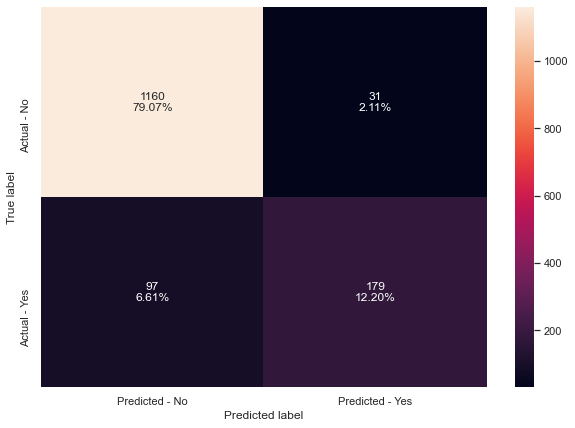

In [212]:
make_confusion_matrix(xgb,y_test)

##### With default parameters:

XGBoost classifier has better test accuracy and better Recall among these 3 models, but is overfitting on train data.
Of all three models, Adaboost has least test accuracy and test recall.

### Hyperparameter Tuning
### AdaBoost Classifier
- An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.
- Some important hyperparamters are:
    * base_estimator: The base estimator from which the boosted ensemble is built. By default the base estimator is a decision tree with max_depth=1
    * n_estimators: The maximum number of estimators at which boosting is terminated. Default value is 50.
    * learning_rate: Learning rate shrinks the contribution of each classifier by learning_rate. There is a trade-off between learning_rate and n_estimators.

In [213]:
# Choose the type of classifier. 
abc_tuned = AdaBoostClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    #Let's try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=1),DecisionTreeClassifier(max_depth=2),DecisionTreeClassifier(max_depth=3)],
    "n_estimators": np.arange(10,110,10),
    "learning_rate":np.arange(0.1,1,0.1)
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(abc_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
abc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                   learning_rate=0.9, n_estimators=100, random_state=1)

In [214]:
#Using above defined function to get accuracy, recall and precision on train and test set
abc_tuned_score=get_metrics_score(abc_tuned)

Accuracy on training set :  0.9885998246126864
Accuracy on test set :  0.8793456032719836
Recall on training set :  0.9503105590062112
Recall on test set :  0.5978260869565217
Precision on training set :  0.9886914378029079
Precision on test set :  0.7142857142857143
F1 Score on training set :  0.9691211401425179
F1 Score on test set :  0.6508875739644971


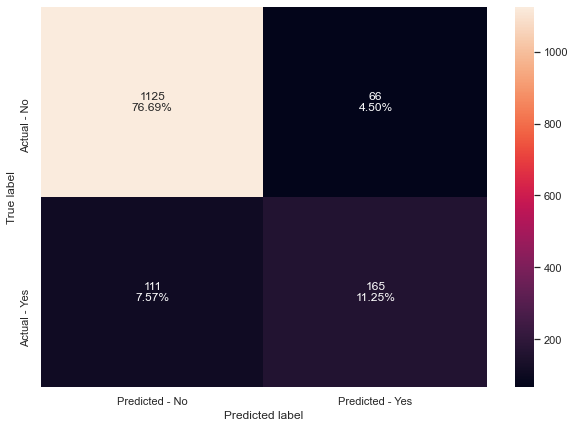

In [215]:

make_confusion_matrix(abc_tuned,y_test)

### Insights
The model is overfitting the train data as train accuracy,train recall,train precision is much higher than the test accuracy, test recall and test precision.
The model is slightly overfitting.

In [216]:
# importance of features in the tree building

print(pd.DataFrame(abc_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))



                                  Imp
MonthlyIncome                0.275644
Age                          0.136991
DurationOfPitch              0.122789
PitchSatisfactionScore       0.063600
NumberOfTrips                0.051955
Gender_Male                  0.041313
NumberOfFollowups            0.040540
PreferredPropertyStar        0.033258
Designation_Executive        0.028656
Passport                     0.023137
CityTier                     0.020931
TypeofContact_Self Enquiry   0.020685
NumberOfChildrenVisited      0.017205
OwnCar                       0.015766
Occupation_Small Business    0.014056
Occupation_Salaried          0.013280
MaritalStatus_Single         0.011436
Occupation_Large Business    0.011357
MaritalStatus_Married        0.010061
NumberOfPersonVisited        0.009913
ProductPitched_Deluxe        0.008957
ProductPitched_Super Deluxe  0.007810
MaritalStatus_Unmarried      0.006990
Designation_Manager          0.005521
ProductPitched_Standard      0.003821
Designation_

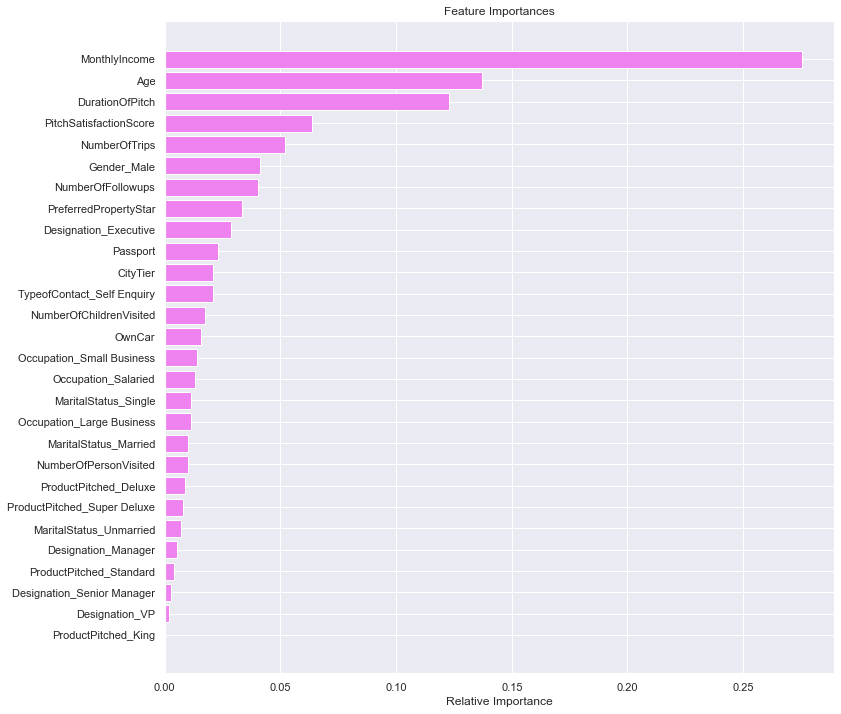

In [217]:
importances = abc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

MonthlyIncome is the most important feature as per the tuned AdaBoost model.

### Gradient Boosting Classifier
Most of the hyperparameters available are same as random forest classifier.
init: An estimator object that is used to compute the initial predictions. If ‘zero’, the initial raw predictions are set to zero. By default, a DummyEstimator predicting the classes priors is used.
There is no class_weights parameter in gradient boosting.

Let's try using AdaBoost classifier as the estimator for initial predictions

In [218]:

gbc_init = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)
gbc_init.fit(X_train,y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           random_state=1)

In [219]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_init_score=get_metrics_score(gbc_init)

Accuracy on training set :  0.8892136802104648
Accuracy on test set :  0.8513974096796183
Recall on training set :  0.4984472049689441
Recall on test set :  0.3695652173913043
Precision on training set :  0.8514588859416445
Precision on test set :  0.6986301369863014
F1 Score on training set :  0.6287952987267386
F1 Score on test set :  0.48341232227488157


##### As compared to the model with default parameters:

Test accuracy and test recall have increased slightly.
As we are getting better results, we will use init = AdaBoostClassifier() to tune the gradient boosting model.

In [220]:
# Choose the type of classifier. 
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
gbc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train, y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.8, n_estimators=250, random_state=1,
                           subsample=0.9)

In [221]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_tuned_score=get_metrics_score(gbc_tuned)

Accuracy on training set :  0.9277988892136803
Accuracy on test set :  0.8718473074301295
Recall on training set :  0.6630434782608695
Recall on test set :  0.4528985507246377
Precision on training set :  0.9343544857768052
Precision on test set :  0.7716049382716049
F1 Score on training set :  0.7756584922797456
F1 Score on test set :  0.5707762557077626


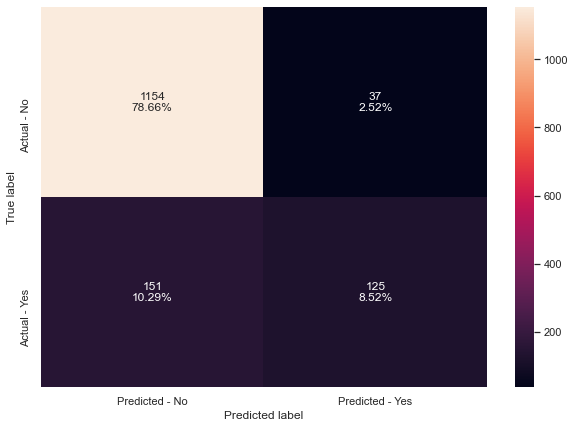

In [222]:
make_confusion_matrix(gbc_tuned,y_test)

### Insights
The model performace has improved and is not overfitting.
The model train and test precision has imrpoved.
It is better at identifying False positives.

In [223]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(gbc_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))


                                  Imp
MonthlyIncome                0.165651
Passport                     0.136120
Age                          0.132986
Designation_Executive        0.121614
DurationOfPitch              0.074846
NumberOfFollowups            0.054757
CityTier                     0.049158
PreferredPropertyStar        0.045516
NumberOfTrips                0.037461
MaritalStatus_Single         0.032994
PitchSatisfactionScore       0.027305
MaritalStatus_Unmarried      0.020803
Occupation_Large Business    0.015526
Gender_Male                  0.015357
TypeofContact_Self Enquiry   0.011544
MaritalStatus_Married        0.009890
ProductPitched_Standard      0.008916
Designation_Senior Manager   0.006001
NumberOfChildrenVisited      0.005383
Occupation_Small Business    0.005150
NumberOfPersonVisited        0.004862
Designation_Manager          0.004333
Occupation_Salaried          0.004238
ProductPitched_Deluxe        0.003857
OwnCar                       0.002692
ProductPitch

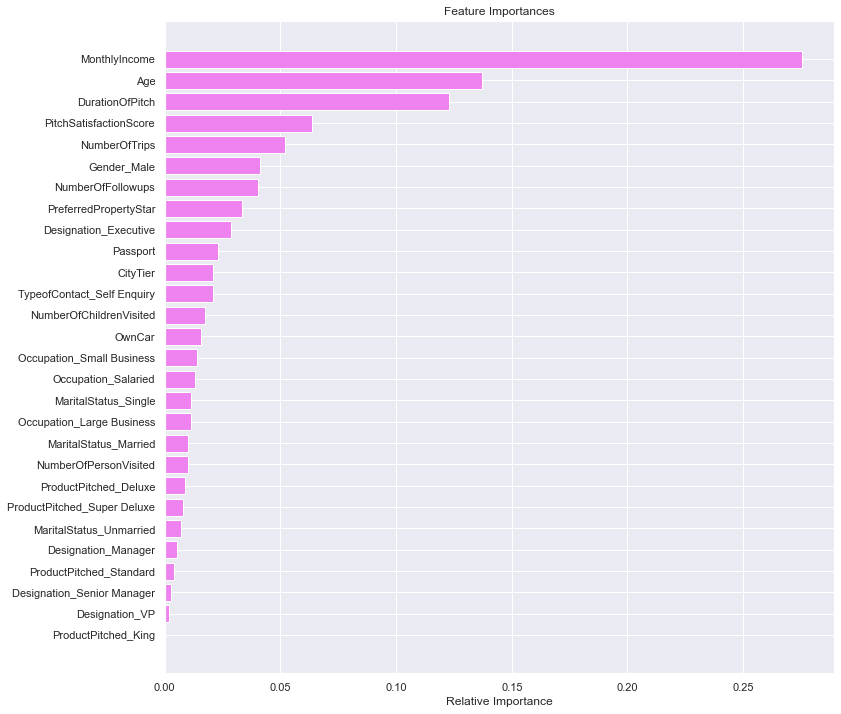

In [224]:
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

MonthlyIncome is the most important feature, followed by Age and DurationOfPitch, as per the tuned gradient boosting model

### XGBoost Classifier
XGBoost has many hyper parameters which can be tuned to increase the model performance. You can read about them in the xgboost documentation here. Some of the important parameters are:

* scale_pos_weight:Control the balance of positive and negative weights, useful for unbalanced classes. It has range from 0 to ∞.
* subsample: Corresponds to the fraction of observations (the rows) to subsample at each step. By default it is set to 1 meaning that we use all rows.
* colsample_bytree: Corresponds to the fraction of features (the columns) to use.
* colsample_bylevel: The subsample ratio of columns for each level. Columns are subsampled from the set of columns chosen for the current tree.
* colsample_bynode: The subsample ratio of columns for each node (split). Columns are subsampled from the set of columns chosen for the current level.
* max_depth: is the maximum number of nodes allowed from the root to the farthest leaf of a tree.
* learning_rate/eta: Makes the model more robust by shrinking the weights on each step.
* gamma: A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split.


In [225]:
def timer(start_time=None):
    if not start_time:
        start_time=datetime.now()
        return start_time
    elif start_time:
        thour,temp_sec=divmod((datetime.now()-start_time).total_seconds(),3600)
        tmin,tsec=divmod(temp_sec,60)
        print('/n Time taken: %i hours %i minute and %s seconds.' %(thour,tmin,round(tsec,2)))

In [226]:
# Choose the type of classifier. 
xgb_tuned = XGBClassifier(eval_metric='logloss',use_label_encoder=False,random_state=1)

# Grid of parameters to choose from
## add from
parameters = {
    #"n_estimators": np.arange(10,100,20),
    #"n_estimators": [10,30,50,70,90],
    "n_estimators": [1,50,100],
    "scale_pos_weight":[0,1,2,5],
    #"subsample":[0.5,0.7,0.9,1],
    "max_depth":[3,4,5,8,10,12,15],
    "learning_rate":[0.05,0.1,0.2,0.5],
    #"gamma":[0,1,3],
    #"gamma":[0.0,0.1,0.2,0.3,0.4],
    "colsample_bytree":[0.5,0.7,0.9,1]
    #"colsample_bylevel":[0.5,0.7,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5)



In [227]:
from datetime import datetime
start_time=timer(None)
grid_obj = grid_obj.fit(X_train, y_train)
timer(start_time)

/n Time taken: 0 hours 12 minute and 37.41 seconds.


In [228]:

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=5, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, random_state=1, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=5, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)

In [229]:
#Using above defined function to get accuracy, recall and precision on train and test set
xgb_tuned_score=get_metrics_score(xgb_tuned)

Accuracy on training set :  0.9318912598655364
Accuracy on test set :  0.8438991138377642
Recall on training set :  0.9580745341614907
Recall on test set :  0.7355072463768116
Precision on training set :  0.7496962332928311
Precision on test set :  0.5654596100278552
F1 Score on training set :  0.8411724608043626
F1 Score on test set :  0.6393700787401575


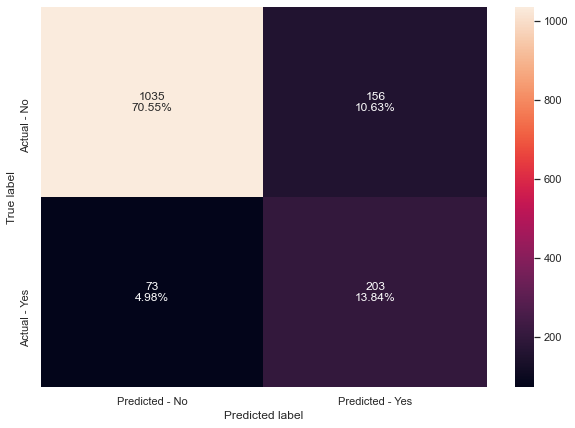

In [230]:
make_confusion_matrix(xgb_tuned,y_test)

### Insights
The test accuracy of the model has reduced as compared to the model with default parameters but the recall has increased significantly and the model is able to identify most of the potential customers.The precision has decreased but is not overfitting anymore.
Decreasing number of false negatives has increased the number of false positives here.
The tuned model is not overfitting and generalizes well.

In [231]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(xgb_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))



                                  Imp
Passport                     0.165111
Designation_Executive        0.126801
CityTier                     0.052116
MaritalStatus_Married        0.045593
PreferredPropertyStar        0.045417
Occupation_Large Business    0.042107
ProductPitched_Deluxe        0.041128
MaritalStatus_Unmarried      0.037262
MaritalStatus_Single         0.035901
ProductPitched_Standard      0.035176
Age                          0.033748
NumberOfFollowups            0.033352
ProductPitched_Super Deluxe  0.032282
NumberOfTrips                0.028366
PitchSatisfactionScore       0.028122
DurationOfPitch              0.027224
Gender_Male                  0.026798
MonthlyIncome                0.025614
ProductPitched_King          0.025329
TypeofContact_Self Enquiry   0.024982
Occupation_Salaried          0.020559
Occupation_Small Business    0.019453
OwnCar                       0.019064
NumberOfPersonVisited        0.015439
NumberOfChildrenVisited      0.013058
Designation_

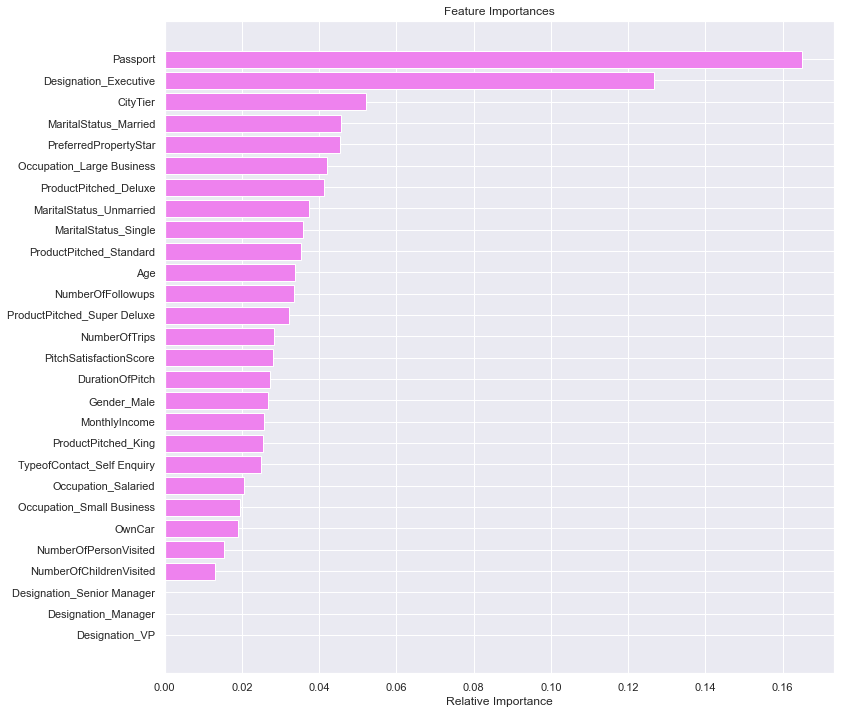

In [232]:
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Passport is the most important feature as per XGBoost model unlike AdaBoost and Gradient Boosting, where the most important feature is the MonthlyIncome.

## Stacking Model

### Now, let's build a stacking model with the tuned models - decision tree, random forest and gradient boosting, then use XGBoost to get the final prediction.

In [233]:
estimators=[('Decision Tree', dtree_tuned),
            ('Random Forest', rf_estimator_tuned),
           ('Gradient Boosting', gbc_tuned),('XGBoost', xgb_tuned)]
final_estimator=XGBClassifier(random_state=1,eval_metric='logloss',use_label_encoder=False)

In [234]:
stacking_estimator=StackingClassifier(estimators=estimators, final_estimator=final_estimator,cv=5)
stacking_estimator.fit(X_train,y_train)

StackingClassifier(cv=5,
                   estimators=[('Decision Tree',
                                DecisionTreeClassifier(class_weight={0: 0.18,
                                                                     1: 0.82},
                                                       max_depth=12,
                                                       max_features='sqrt',
                                                       min_samples_leaf=10,
                                                       min_samples_split=80,
                                                       random_state=1)),
                               ('Random Forest',
                                RandomForestClassifier(max_features=0.6,
                                                       max_samples=0.6,
                                                       min_samples_leaf=5,
                                                       n_estimators=250,
                                                       r

In [235]:
stacking_estimator_score=get_metrics_score(stacking_estimator)

Accuracy on training set :  0.9356913183279743
Accuracy on test set :  0.8629856850715747
Recall on training set :  0.7950310559006211
Recall on test set :  0.5615942028985508
Precision on training set :  0.8533333333333334
Precision on test set :  0.6595744680851063
F1 Score on training set :  0.8231511254019293
F1 Score on test set :  0.6066536203522505


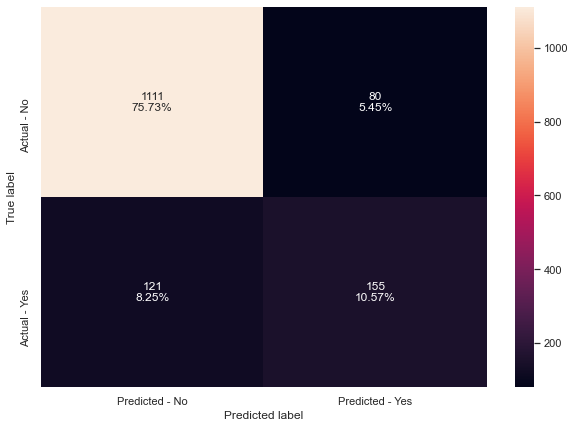

In [236]:
make_confusion_matrix(stacking_estimator,y_test)

In [237]:
estimators1=[('Random Forest', rf_estimator_tuned),
           ('Gradient Boosting', gbc_tuned),('AdaBoost Tuned', abc_tuned)]
final_estimator1=GradientBoostingClassifier(random_state=1)

In [238]:
stacking_estimator1=StackingClassifier(estimators=estimators1, final_estimator=final_estimator1,cv=5)
stacking_estimator1.fit(X_train,y_train)

StackingClassifier(cv=5,
                   estimators=[('Random Forest',
                                RandomForestClassifier(max_features=0.6,
                                                       max_samples=0.6,
                                                       min_samples_leaf=5,
                                                       n_estimators=250,
                                                       random_state=1)),
                               ('Gradient Boosting',
                                GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                                                           max_features=0.8,
                                                           n_estimators=250,
                                                           random_state=1,
                                                           subsample=0.9)),
                               ('AdaBoost Tuned',
                                AdaBoostClassifier(b

In [239]:
stacking_estimator_score1=get_metrics_score(stacking_estimator1)

Accuracy on training set :  0.9798304589301374
Accuracy on test set :  0.8807089297886844
Recall on training set :  0.9285714285714286
Recall on test set :  0.5978260869565217
Precision on training set :  0.9629629629629629
Precision on test set :  0.7205240174672489
F1 Score on training set :  0.9454545454545454
F1 Score on test set :  0.6534653465346535


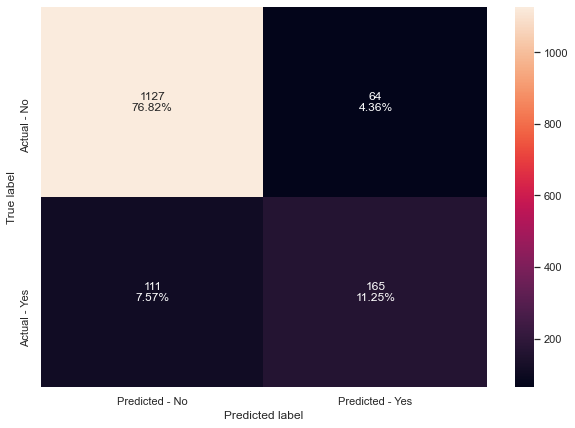

In [240]:
make_confusion_matrix(stacking_estimator1,y_test)

### Comparing all models

In [241]:
# defining list of models
models = [DTModel,dtree_tuned,bagging_estimator,bagging_estimator_tuned,bagging_lr,rf_estimator,rf_estimator_tuned,
          rf_estimator_weighted,abc, abc_tuned, gbc, gbc_init, gbc_tuned, xgb, xgb_tuned,stacking_estimator,stacking_estimator1]

#models = [abc, abc_tuned, gbc, gbc_init, gbc_tuned, xgb, xgb_tuned,stacking_estimator]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_score_train = []
f1_score_test = []

# looping through all the models to get the accuracy, precall and precision scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_test.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_test.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_test.append(np.round(j[5],2))
    f1_score_train.append(np.round(j[6],2))
    f1_score_test.append(np.round(j[7],2))

In [242]:
 comparison_frame = pd.DataFrame({'Model':['Decision Tree Model','Tuned Decision Tree','Bagging classifier with default parameters','Tuned Bagging Classifier',
                                        'Bagging classifier with base_estimator=LR', 'Random Forest with deafult parameters',
                                         'Tuned Random Forest Classifier','Random Forest with class_weights','AdaBoost with default paramters','AdaBoost Tuned', 
                                          'Gradient Boosting with default parameters','Gradient Boosting with init=AdaBoost',
                                          'Gradient Boosting Tuned','XGBoost with default parameters','XGBoost Tuned','Stacking with Tuned models','Stacking with Better precision models'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_F1_Score':f1_score_train,'Test_F1_Score':f1_score_test}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1_Score,Test_F1_Score
0,Decision Tree Model,1.00,0.89,1.00,0.63,1.00,0.72,1.00,0.68
1,Tuned Decision Tree,0.76,0.72,0.81,0.68,0.42,0.37,0.56,0.48
2,Bagging classifier with default parameters,0.99,0.92,0.97,0.68,1.00,0.86,0.98,0.76
3,Tuned Bagging Classifier,1.00,0.91,0.99,0.61,1.00,0.88,1.00,0.72
4,Bagging classifier with base_estimator=LR,0.85,0.83,0.29,0.26,0.73,0.61,0.42,0.36
5,Random Forest with deafult parameters,1.00,0.90,1.00,0.55,1.00,0.88,1.00,0.68
6,Tuned Random Forest Classifier,0.92,0.86,0.60,0.40,0.95,0.76,0.74,0.52
7,Random Forest with class_weights,0.89,0.82,0.84,0.61,0.66,0.53,0.74,0.56
8,AdaBoost with default paramters,0.86,0.83,0.38,0.29,0.73,0.60,0.50,0.39
9,AdaBoost Tuned,0.99,0.88,0.95,0.60,0.99,0.71,0.97,0.65


- Tuned gradient boosting model is the better model here as model accuracy, precision and f1-score are good. 
- Tuned Random classifier,TunedGradient boosting, stacking classifier(with better precision models) 2 are the top 3 models. They are all giving better performances.

# Insights and Recommendation
* The company wants to reduce the marketing costs for the wellness travel package that is going to be introduced by targeting the potential customers. Hence, precision is the right metric to check the performance of the model. 
* However, in order to increase the revenues, the business must also take steps to prevent misclassification of the potential customers as non-customers. So, F1- score was also considered. 
* Over 70% of the contact with “Visit with us” are from self enquiries and about 30% of the people are invited by the company. However,  the people contacted by the business are more likely to purchase the travel packages compared to those who self-enquired. The business has the following opportunities to reduce the marketing costs and improve conversion.
   - Identify the sources (word of mouth, website reviews, social media recommendations, commercials) that are driving the self-enquiries and invest more in these sources. This will help them widen their reach and reduce marketing costs.
   - One third of the customers give less than average rating to the pitchsatisfaction score. The business should invest to train the associates on the packages to improve score. More knowledgeable associates will improve the perception of the company  and increase the chance of turning self-enquiring people to customers.
   - We also noticed that as the number of follow-ups increases, the likelihood of people buying the packages increases. In addition to training the associates, the business should work on improving the customer service by simplifying the purchasing process to reduce the follow ups needed to generate sales. 

*  It is recommended that “Visit by us” add attractive pictures and videos of the travel locations to impress potential customers.  They can also hire “social media influencers” to increase their reach.
*  It may be beneficial to provide the customizable wellness travel packages (3 day, 5 day, different locations, 3 star or 5 star stay, etc.) so that the customers can “build their own package” based on their convenience and financials. 
*  It is interesting to note that the Super Deluxe and King packages are not even pitched to unmarried people. We also observe exclusivity in the packages that are recommended to the customers based on their designation and salary. The business should focus more on the customer needs and recommend packages without any biases. 
   - The business must conduct surveys from all customers who contacted the business irrespective of if they purchase the package or not for the following reasons.
   - The surveys help understand the reasons the customers who enquired but did not purchase the package and help improve the offerings. 
   - By surveying the customers who purchased the package the business will have the opportunity to learn about what worked and what did not and improve on their shortcomings. They can also use this data to design tailored perks to increase customer retention and loyalty. 


